In [1]:
import pandas as pd
import numpy as np
from sklearn.preprocessing import StandardScaler
import seaborn as sns
import matplotlib.pyplot as plt

from sklearn.cluster import KMeans, DBSCAN
from sklearn.cluster import AgglomerativeClustering, AffinityPropagation, SpectralClustering
from sklearn.metrics import silhouette_score
from sklearn.decomposition import PCA
from sklearn.manifold import TSNE

In [2]:
final_df = pd.read_csv('data/final_df.csv', index_col='Unnamed: 0')
final_df = final_df.drop('Российская Федерация')

In [3]:
final_df

,child_mortality_coefficient,"Беременность, роды и послеродовой период_15-17 лет",Болезни глаза и его придаточного аппарата_15-17 лет,Болезни костно-мышечной системы и соединительной ткани_15-17 лет,Болезни мочеполовой системы_15-17 лет,Болезни нервной системы_15-17 лет,Болезни органов дыхания_15-17 лет,Болезни органов пищеварения_15-17 лет,Болезни системы кровообращения_15-17 лет,Болезни уха и сосцевидного отростка_15-17 лет,...,несовершеннолетними или при их соучастии_небольшой тяжести,ранее совершавшими преступления_небольшой тяжести,ранее судимыми (из совершивших преступление)_небольшой тяжести,группой лиц_небольшой тяжести,группой лиц по предварительному сговору_небольшой тяжести,организованной группой_небольшой тяжести,преступным сообществом (преступной организацией)_небольшой тяжести,в состоянии опьянения: алкогольного_небольшой тяжести,в состоянии опьянения: наркотического_небольшой тяжести,в состоянии опьянения: токсического_небольшой тяжести
Белгородская область,4.148784,1552.633333,6814.016667,7113.075000,8923.558333,5713.058333,70321.958333,5332.566667,3306.516667,5488.275000,...,4.703833,175.378000,99.977000,0.333500,0.754167,0.010833,0.000000,102.408333,2.316667,0.032333
Брянская область,2.578321,1084.783333,6697.716667,5958.075000,5955.050000,5294.416667,73767.800000,11101.283333,2703.808333,3644.508333,...,4.442500,249.834500,140.247000,0.700500,1.260333,0.027667,0.000000,174.794833,1.221167,0.014167
Владимирская область,6.353141,1571.816667,5922.150000,5585.450000,8114.858333,4076.250000,86129.891667,6437.308333,1344.958333,3827.375000,...,7.769667,212.821333,115.027667,1.169333,1.091333,0.035833,0.000000,143.373000,1.898000,0.072000
Воронежская область,3.784844,681.666667,4034.775000,5173.083333,3836.483333,2321.066667,40923.516667,4053.225000,1032.433333,2976.908333,...,4.953167,183.645833,99.484667,0.415333,0.515833,0.121500,0.000000,112.902167,5.984000,0.021500
Ивановская область,2.669444,1257.616667,7215.333333,6528.516667,7377.441667,3509.666667,97525.241667,3590.883333,1070.108333,4317.341667,...,10.122000,255.121667,126.699333,0.752000,1.466000,0.000000,0.000000,159.988333,0.754167,0.065167
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
Сахалинская область,3.191412,5753.925000,4548.725000,5834.083333,5538.050000,2316.841667,84218.325000,13937.633333,1397.383333,2290.675000,...,8.604667,341.985167,156.812833,1.365000,3.144167,0.547000,0.000000,244.244500,5.361333,0.102500
Еврейская автономная область,9.616482,2210.100000,3436.758333,3310.675000,5715.333333,1901.808333,50517.700000,4673.091667,2360.541667,2051.925000,...,10.235667,314.203833,164.557167,1.951667,1.247500,0.000000,0.000000,148.881000,1.844333,0.104167
Чукотский автономный округ,15.003366,1743.275000,8524.791667,5799.600000,5183.825000,4109.058333,91528.783333,8345.975000,1796.525000,4540.233333,...,10.354833,344.761833,137.866167,2.329833,0.669167,0.000000,0.000000,332.363333,2.009000,0.000000
город Москва,2.957387,225.175000,4403.691667,4801.700000,3610.600000,2248.016667,69148.400000,3813.116667,1286.258333,2683.391667,...,1.028667,61.162333,36.146667,0.350333,0.668833,0.058500,0.000000,29.136667,1.955167,0.013167


In [3]:
# Стандартизацтя
scaler = StandardScaler()
df_scaled = final_df.copy()
df_scaled[df_scaled.columns] = scaler.fit_transform(df_scaled)
df_scaled

,child_mortality_coefficient,"Беременность, роды и послеродовой период_15-17 лет",Болезни глаза и его придаточного аппарата_15-17 лет,Болезни костно-мышечной системы и соединительной ткани_15-17 лет,Болезни мочеполовой системы_15-17 лет,Болезни нервной системы_15-17 лет,Болезни органов дыхания_15-17 лет,Болезни органов пищеварения_15-17 лет,Болезни системы кровообращения_15-17 лет,Болезни уха и сосцевидного отростка_15-17 лет,...,несовершеннолетними или при их соучастии_небольшой тяжести,ранее совершавшими преступления_небольшой тяжести,ранее судимыми (из совершивших преступление)_небольшой тяжести,группой лиц_небольшой тяжести,группой лиц по предварительному сговору_небольшой тяжести,организованной группой_небольшой тяжести,преступным сообществом (преступной организацией)_небольшой тяжести,в состоянии опьянения: алкогольного_небольшой тяжести,в состоянии опьянения: наркотического_небольшой тяжести,в состоянии опьянения: токсического_небольшой тяжести
Белгородская область,-0.167732,0.076777,0.505605,0.570707,1.356063,1.421057,0.224452,-0.469895,2.126529,2.739775,...,-0.760287,-0.874326,-0.728279,-1.253679,-0.626112,-0.613645,-0.305635,-0.850013,-0.642436,-0.260071
Брянская область,-1.065513,-0.449706,0.442946,0.021168,-0.005570,1.124580,0.410638,1.086547,1.326809,0.505234,...,-0.807530,-0.216529,0.024197,-0.733611,-0.136992,-0.484818,-0.305635,-0.084090,-0.983881,-0.696743
Владимирская область,1.092425,0.098364,0.025093,-0.156124,0.985118,0.261891,1.078587,-0.171827,-0.476216,0.726858,...,-0.206048,-0.543527,-0.447046,-0.069237,-0.300300,-0.422317,-0.305635,-0.416565,-0.772926,0.693397
Воронежская область,-0.375784,-0.903342,-0.991769,-0.352325,-0.977341,-0.981107,-1.364008,-0.815070,-0.890898,-0.303859,...,-0.715212,-0.801282,-0.737479,-1.137715,-0.856418,0.233300,-0.305635,-0.738978,0.500594,-0.520472
Ивановская область,-1.013421,-0.255212,0.721822,0.292579,0.646871,-0.139356,1.694302,-0.939814,-0.840908,1.320670,...,0.219205,-0.169819,-0.228952,-0.660631,0.061748,-0.696554,-0.305635,-0.240758,-1.129435,0.529144
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
Сахалинская область,-0.715030,4.804585,-0.714868,-0.037826,-0.196845,-0.984099,0.975301,1.851815,-0.406655,-1.135536,...,-0.055098,0.597589,0.333743,0.208038,1.683396,3.489703,-0.305635,0.650760,0.306522,1.426525
Еврейская автономная область,2.957967,0.816639,-1.313963,-1.238443,-0.115526,-1.278020,-0.845614,-0.647826,0.871337,-1.424887,...,0.239753,0.352151,0.478452,1.039392,-0.149393,-0.696554,-0.305635,-0.358285,-0.789653,1.466587
Чукотский автономный округ,6.037467,0.291310,1.427320,-0.054233,-0.359325,0.285125,1.370301,0.343145,0.122957,1.590802,...,0.261296,0.622120,-0.020291,1.575284,-0.708249,-0.696554,-0.305635,1.583148,-0.738330,-1.037267
город Москва,-0.848813,-1.417042,-0.793007,-0.529026,-1.080952,-1.032840,0.161042,-0.879853,-0.554104,-0.659585,...,-1.424680,-1.883381,-1.920999,-1.229825,-0.708571,-0.248846,-0.305635,-1.625303,-0.755108,-0.720780


# Мультиколлинеарность

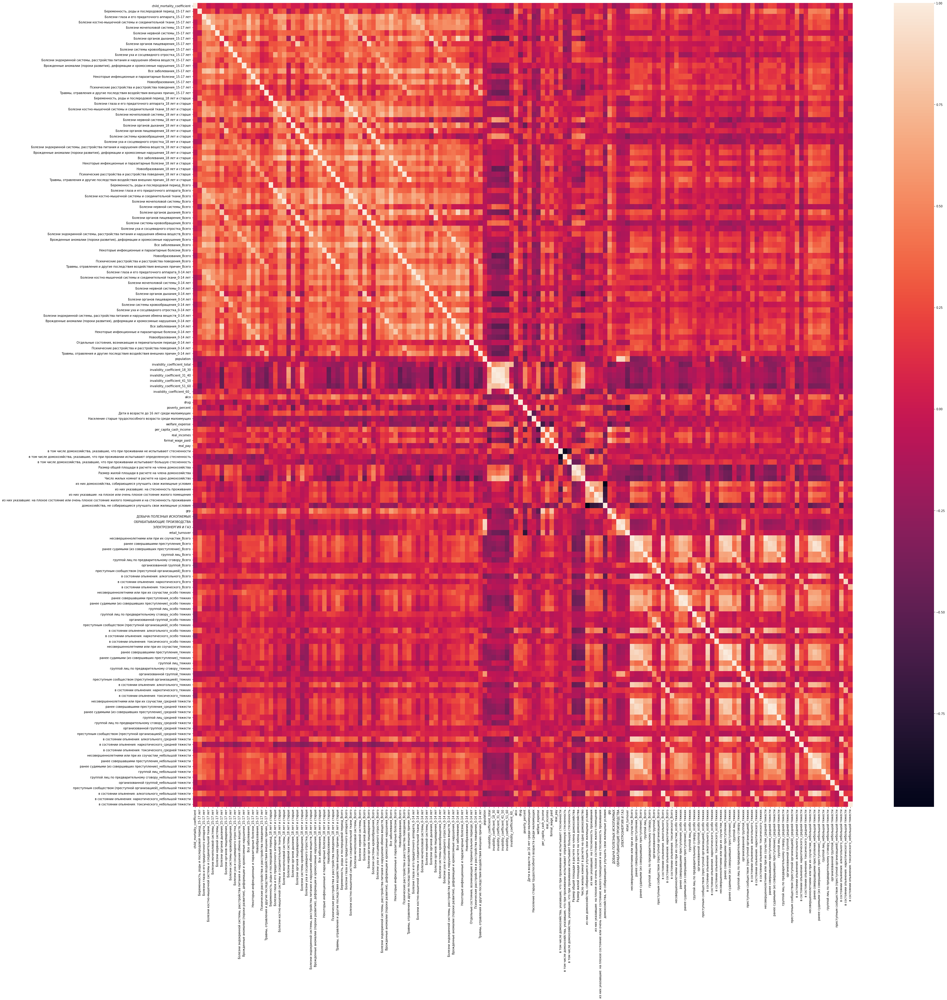

In [4]:
fig, ax = plt.subplots(figsize=(50,50))
corr_df = df_scaled.corr()
sns.heatmap(corr_df);

In [5]:
# избавляемся от мультиколлинеарности (>0.7 | <-0.7)
df = corr_df.copy()
for col in df.columns:
    if col not in df.columns:
        continue
    multicoll_features = list(
        df.loc[col].loc[(df.loc[col]>0.7)|(df.loc[col]<-0.7)].index
    )
    if (len(multicoll_features)>1) & ('grp' in multicoll_features):
        print(multicoll_features)
    multicoll_features.remove(col)
    df = df.drop(multicoll_features, axis=0)
    df = df.drop(multicoll_features, axis=1)
df_scaled_without_multicoll = df_scaled[df.columns]

['per_capita_cash_income', 'formal_wage_paid', 'grp']


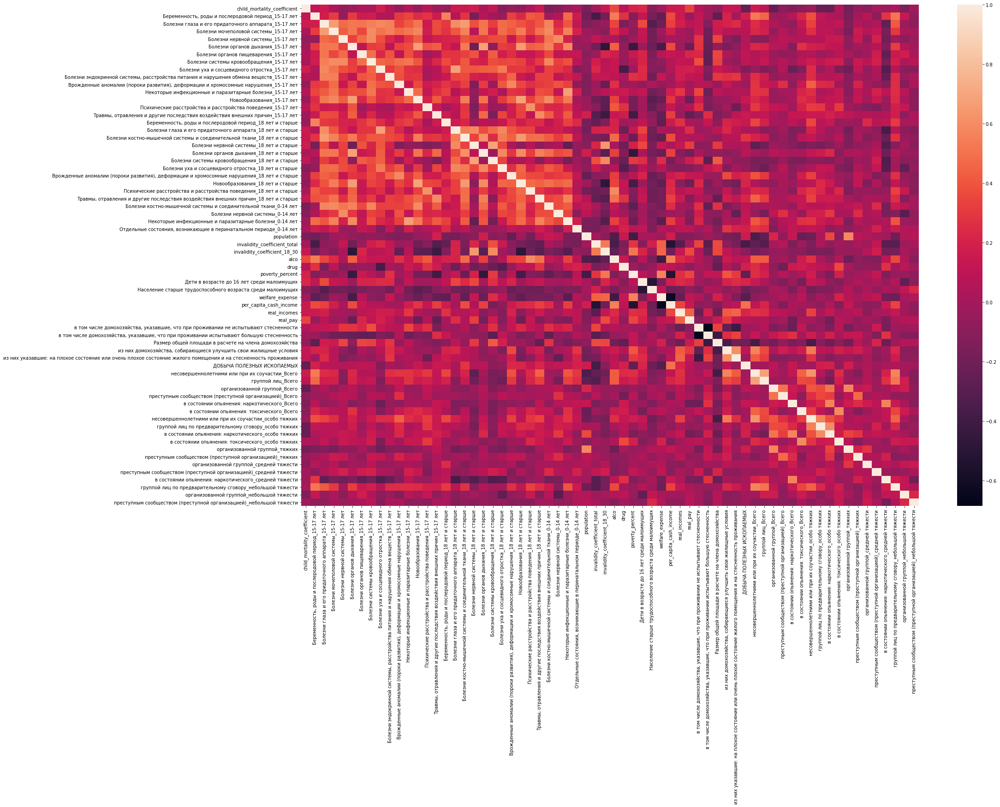

In [8]:
fig, ax = plt.subplots(figsize=(30,20))
corr_df_without_multicol = df_scaled_without_multicoll.corr()
sns.heatmap(corr_df_without_multicol);

# Исследование распределений

In [ ]:
for col in df_scaled_without_multicoll.columns:
    fig, ax = plt.subplots(figsize=(15,30))
    series = df_scaled_without_multicoll[col].sort_values()
    bar = ax.barh(y=series.index, width=series)
    ax.bar_label(bar)
    ax.set_title(col)
    plt.show();

# Понижение размерности

In [7]:
def t_SNE(df,n_components,perplexity=30,learning_rate='auto',init='pca'):
    model = TSNE(n_components=n_components, 
                 perplexity=perplexity,
                 learning_rate=learning_rate,
                 method='exact',
                 init=init,
                 random_state=42
                 )
    model.fit(df)
    return model.fit_transform(df)

In [8]:
def pca(df,n_components=0.9):
    model = PCA(n_components=n_components,
                random_state=42)
    model.fit(df)
    return model.transform(df)

In [11]:
df_pca = pd.DataFrame(pca(df_scaled_without_multicoll,n_components=0.85),
                      index=df_scaled_without_multicoll.index)

In [12]:
df_tsne = pd.DataFrame(t_SNE(df=df_scaled_without_multicoll,
                                 n_components=12,
                                 init='pca'), 
                           index=df_scaled_without_multicoll.index)

# Кластеризация всей таблицы

## KMeans

In [9]:
def get_n(df,max_n):
    scores = []
    for n in range(2,max_n):
        model = KMeans(n_clusters=n, n_init=20, random_state=42)
        model.fit(df)
        scores.append(silhouette_score(df,model.labels_))
    fig, ax = plt.subplots()
    ax.plot(range(2,max_n),scores)
    return ax

In [10]:
def inertia_n(df,max_n):
    scores = []
    for n in range(2,max_n):
        model = KMeans(n_clusters=n, n_init=20, random_state=42)
        model.fit(df)
        scores.append(model.inertia_)
    plt.plot(range(2,max_n),scores);

### Определим минимальное число кластеров

<AxesSubplot:>

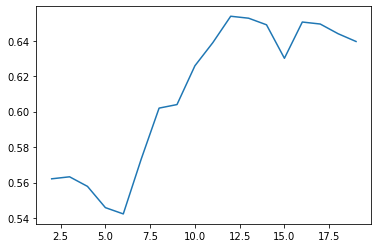

In [21]:
get_n(df_scaled_without_multicoll[['poverty_percent']],max_n=20)

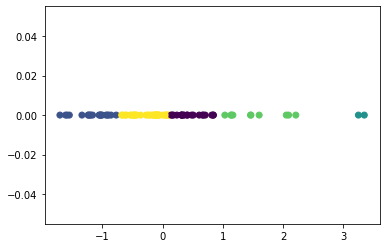

In [45]:
model = KMeans(n_clusters=5, n_init=20, random_state=42)
df = df_scaled_without_multicoll[['poverty_percent']]
model.fit(df)
plt.scatter(x=df.values, y=np.zeros(df.shape[0]), c=model.labels_);

По распределению бедности понятно, что его лучше делить не менее, чем на 8 кластеров. Возьмём 8, как минимальное количество кластеров для нашей таблицы.

### Подбираем n_components и n_clusters

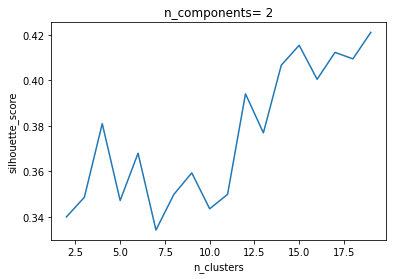

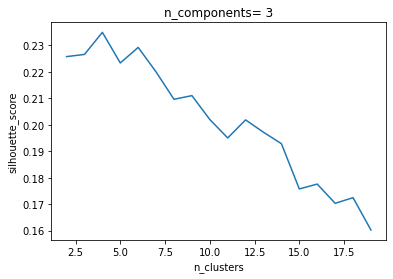

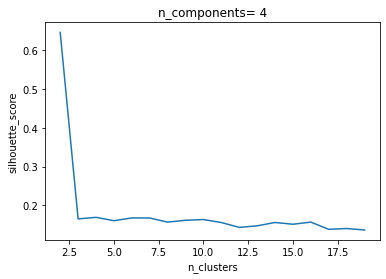

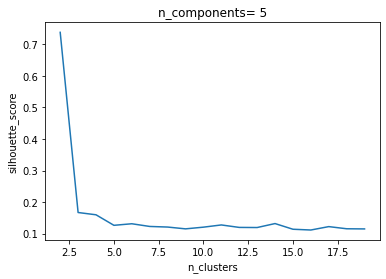

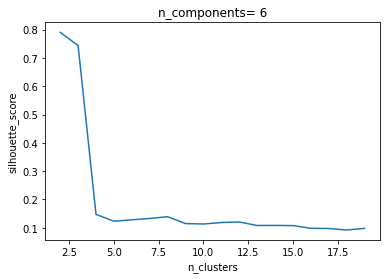

...

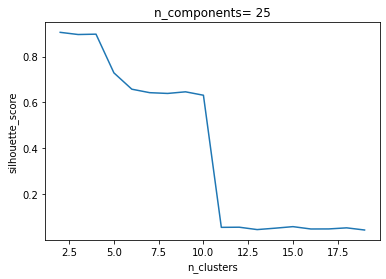

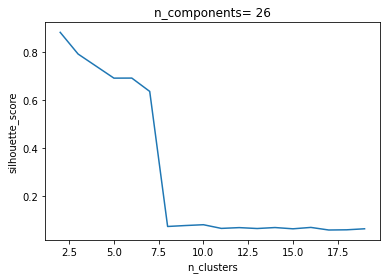

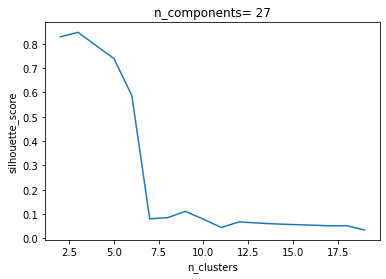

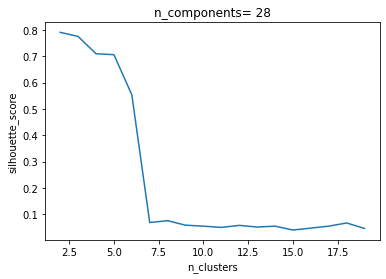

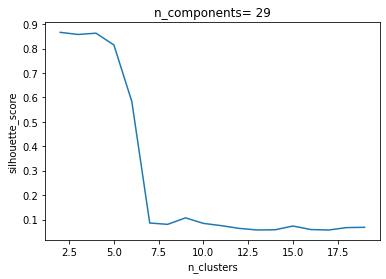

In [33]:
for n_components in range(2,30):
    df_tsne = pd.DataFrame(t_SNE(df=df_scaled_without_multicoll,
                                 n_components=n_components,
                                 init='pca'), 
                           index=df_scaled_without_multicoll.index)
    ax = get_n(df_tsne,20)
    title = 'n_components= {}'.format(n_components)
    ax.set_title(title)
    ax.set_xlabel('n_clusters')
    ax.set_ylabel('silhouette_score')
    plt.show()

n_components = 2 или 3 скорее всего нам не подойдут, т.к. разнообразие данных больше, тем более коэффициент силуэта резко упал при n_components=4. Т.к. кластеров должно быть минимум 8, то оптимально взять n_components=14 (коэффициент силуэта при 8 и более кластеров там больше, чем на других графиках), а количество кластеров можно будет подобрать от 8 до 12-ти.  

Меняя остальные гиперпараметры у TSNE: init={'rangom','pca'}, perplexity={5,30,50} и наблюдая за графиками, делаю вывод, что оптимальный вариант по-прежнему остаётся: n_components=14,init='pca',perplexity=30.

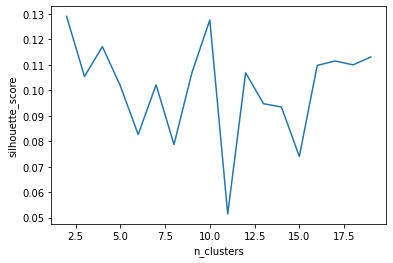

In [41]:

df_pca = pd.DataFrame(pca(df=df_scaled_without_multicoll, n_components=0.7), 
                        index=df_scaled_without_multicoll.index)
ax = get_n(df_pca,20)
ax.set_xlabel('n_clusters')
ax.set_ylabel('silhouette_score')
plt.show()

При проведении той же самой процедуры, но использовании PCA, видно, что значение силуэта сильно скачет, от количества кластеров. Т.к. количество кластеров всё-таки точно не известно, PCA использовать не буду.

### Смотрим результаты модели

In [36]:
transformed_df = t_SNE(df=df_scaled_without_multicoll, n_components=10)
model = KMeans(n_clusters=8, n_init=20)
model.fit(transformed_df)
print(silhouette_score(transformed_df,model.labels_))
df = df_scaled_without_multicoll.copy()
df['cluster'] = model.labels_
df['cluster'].value_counts()

0.084403306


cluster
2    24
1    22
6    19
0    16
7     1
5     1
4     1
3     1
Name: count, dtype: int64

In [46]:
model = KMeans(n_clusters=8, n_init=20)
model.fit(transformed_df)
print(silhouette_score(transformed_df,model.labels_))
df = df_scaled_without_multicoll.copy()
df['cluster'] = model.labels_
df['cluster'].value_counts()

0.09184512


cluster
6    21
1    21
0    16
7    16
4     8
5     1
2     1
3     1
Name: count, dtype: int64

Не смотря на то, что коэффициент силуэта довольно хороший, такое разбиение явно не подходит для моих целей. Оно всего лишь собрало много регионов в один кластер и оставило несколько "выбросов". Если же мы будем пытаться делить кластер с большим количеством регионов, то коэффициент силуэта резко падает. Теперь понятно почему получалось резкое падение на графиках.

Коэффициент силуэта не подходит для оценивания качества кластеризации этих данных. KMeans тоже не подходит для разбиения: либо разбиение включает в себя один кластер и много выбросов, либо если кластеров несколько, то разбиение не стабильное и сильно зависит от random_state.

## Affinity Propagation

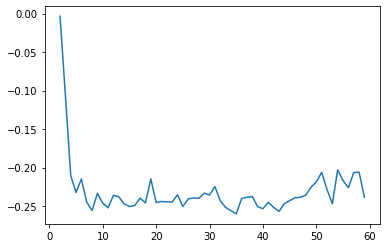

In [84]:
scores = []
for n_components in range(2,20):
    df_tsne = pd.DataFrame(t_SNE(df=df_scaled_without_multicoll,
                                 n_components=n_components,
                                 init='pca'), 
                           index=df_scaled_without_multicoll.index)
    model = AffinityPropagation()
    model.fit(df_tsne)
    scores.append(silhouette_score(df_scaled_without_multicoll,model.labels_))
plt.plot(range(2,20),scores);

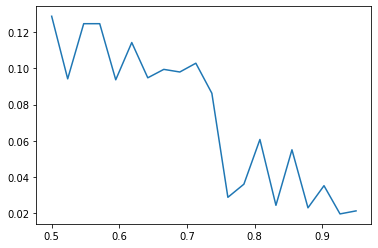

In [77]:
scores = []
for n_components in np.linspace(0.5,0.95,20):
    df_tsne = pd.DataFrame(pca(df=df_scaled_without_multicoll,
                                 n_components=n_components,
                                 ), 
                           index=df_scaled_without_multicoll.index)
    model = AffinityPropagation()
    model.fit(df_tsne)
    scores.append(silhouette_score(df_tsne,model.labels_))
plt.plot(np.linspace(0.5,0.95,20),scores);

In [81]:
df_tsne = pd.DataFrame(t_SNE(df=df_scaled_without_multicoll,
                                n_components=2,
                                init='pca'), 
                        index=df_scaled_without_multicoll.index)
model = AffinityPropagation()
model.fit(df_tsne)
print(silhouette_score(df_scaled_without_multicoll,model.labels_))
df = df_scaled_without_multicoll.copy()
df['cluster'] = model.labels_
df['cluster'].value_counts()

-0.0034117931988082244


cluster
1    17
2    15
9    10
7    10
6     8
0     7
8     6
3     5
4     4
5     3
Name: count, dtype: int64

In [76]:
df_tsne = pd.DataFrame(pca(df=df_scaled_without_multicoll,
                                n_components=0.95,
                                ), 
                        index=df_scaled_without_multicoll.index)
model = AffinityPropagation()
model.fit(df_tsne)
print(silhouette_score(df_scaled_without_multicoll,model.labels_))
df = df_scaled_without_multicoll.copy()
df['cluster'] = model.labels_
df['cluster'].value_counts()

0.01930475193774342


cluster
2     17
7     16
0     15
12    14
5     12
9      2
1      1
3      1
4      1
6      1
8      1
10     1
11     1
13     1
14     1
Name: count, dtype: int64

In [78]:
model = AffinityPropagation()
model.fit(df_scaled_without_multicoll)
print(silhouette_score(df_scaled_without_multicoll,model.labels_))
df = df_scaled_without_multicoll.copy()
df['cluster'] = model.labels_
df['cluster'].value_counts()

0.017079129034961376


cluster
2     18
7     16
0     15
12    13
5     12
9      2
1      1
3      1
4      1
6      1
8      1
10     1
11     1
13     1
14     1
Name: count, dtype: int64

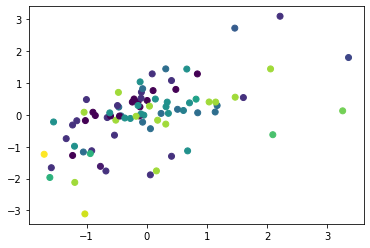

In [32]:
df = df_scaled_without_multicoll[['poverty_percent','welfare_expense']]
plt.scatter(x=df['poverty_percent'], y=df['welfare_expense'], c=model.labels_);

Создаёт много выбросов, но не складывает все регионы в один кластер.

## Agglomerative Clustering

In [322]:
def get_n(df,max_n):
    scores = []
    for n in range(2,max_n):
        model = AgglomerativeClustering(n_clusters=n, linkage='single')
        model.fit(df)
        scores.append(silhouette_score(df,model.labels_))
    fig, ax = plt.subplots()
    ax.plot(range(2,max_n),scores)
    return ax

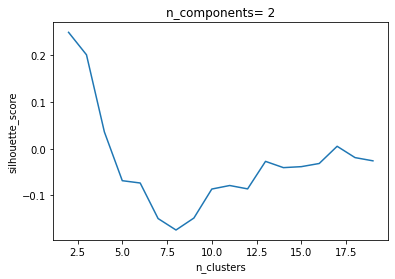

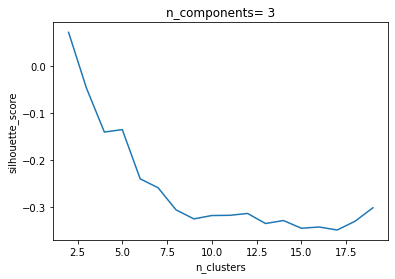

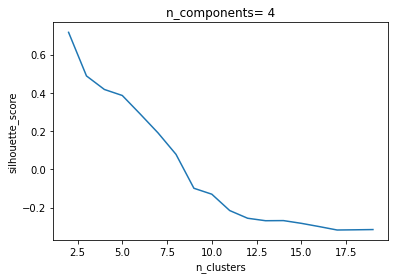

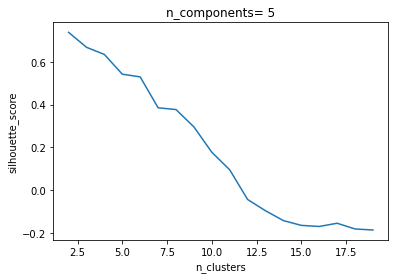

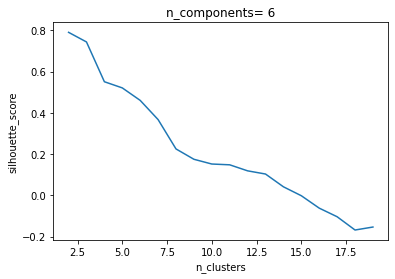

...

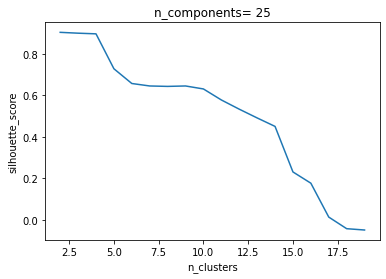

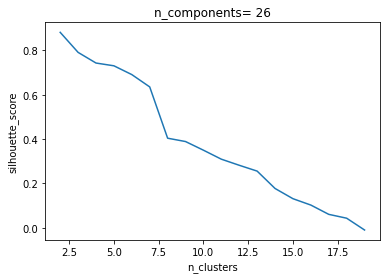

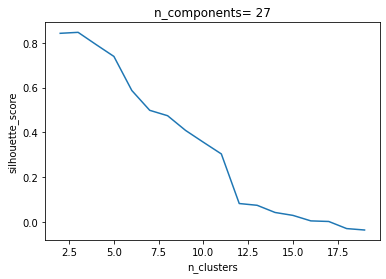

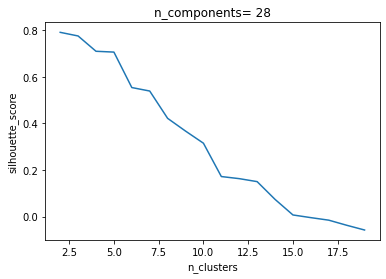

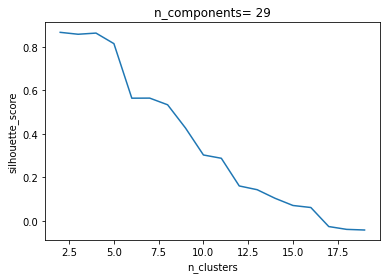

In [323]:
for n_components in range(2,30):
    df_tsne = pd.DataFrame(t_SNE(df=df_scaled_without_multicoll,
                                 n_components=n_components,
                                 init='pca'), 
                           index=df_scaled_without_multicoll.index)
    ax = get_n(df_tsne,20)
    title = 'n_components= {}'.format(n_components)
    ax.set_title(title)
    ax.set_xlabel('n_clusters')
    ax.set_ylabel('silhouette_score')
    plt.show()

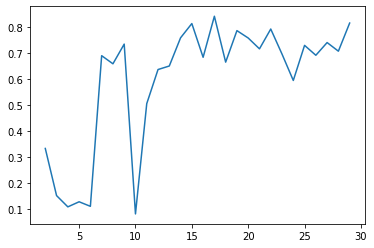

In [303]:
scores = []
for n_components in range(2,30):
    df_tsne = pd.DataFrame(t_SNE(df=df_scaled_without_multicoll,
                                 n_components=n_components,
                                 init='pca'), 
                           index=df_scaled_without_multicoll.index)
    model = AgglomerativeClustering(n_clusters=5,linkage='ward')
    model.fit(df_tsne)
    scores.append(silhouette_score(df_tsne,model.labels_))
plt.plot(range(2,30),scores);

In [328]:
df_tsne = pd.DataFrame(t_SNE(df=df_scaled_without_multicoll,
                                 n_components=10,
                                 init='pca'), 
                           index=df_scaled_without_multicoll.index)
model = AgglomerativeClustering(n_clusters=10,linkage='ward')
model.fit(df_tsne)
df = df_scaled_without_multicoll.copy()
df['cluster'] = model.labels_
df['cluster'].value_counts()

cluster
6    23
0    22
2    20
4    12
1     3
7     1
5     1
9     1
8     1
3     1
Name: count, dtype: int64

С агломеративной кластеризацией ситуация та же самая, как с KMeans, только она не зависит от random_state, поэтому выдаёт всегда одинаковые результаты. Похоже и на Affinity Propagation.

## Spectral Clustering

In [11]:
def get_n(df,max_n):
    scores = []
    for n in range(2,max_n):
        model = SpectralClustering(n_clusters=n, random_state=42)
        model.fit(df)
        scores.append(silhouette_score(df,model.labels_))
    fig, ax = plt.subplots()
    ax.plot(range(2,max_n),scores)
    return ax

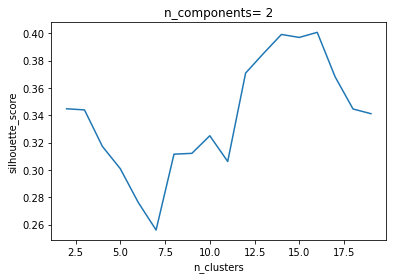

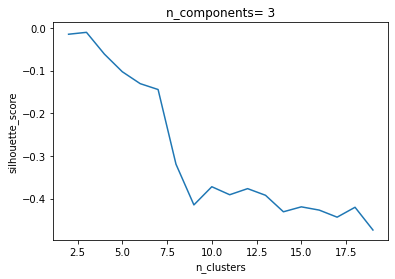

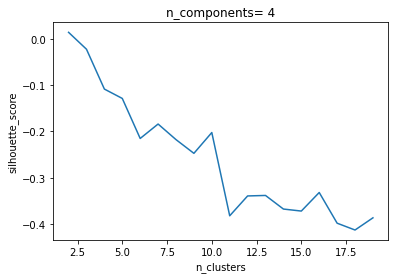

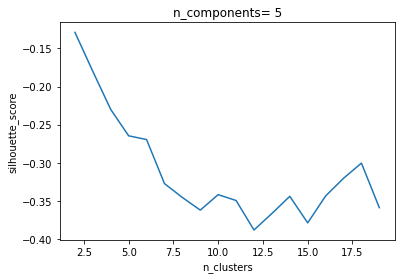

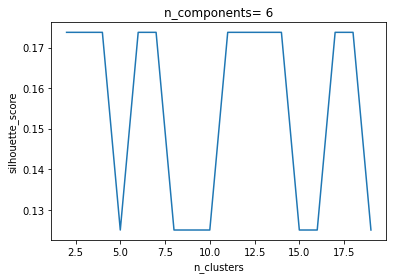

...

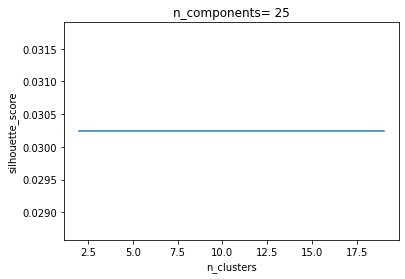

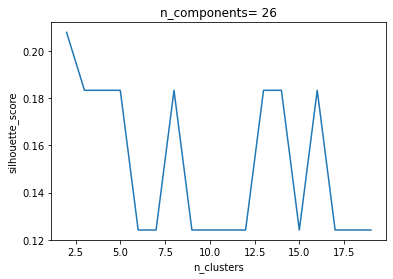

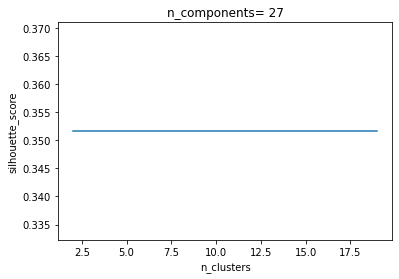

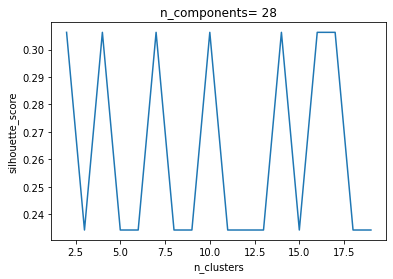

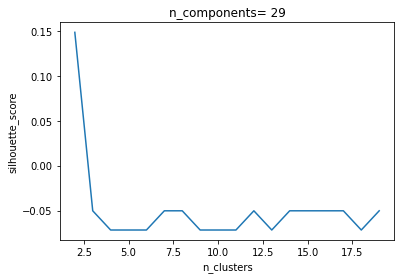

In [12]:
import warnings
warnings.filterwarnings('ignore')
for n_components in range(2,30):
    df_tsne = pd.DataFrame(t_SNE(df=df_scaled_without_multicoll,
                                 n_components=n_components,
                                 init='pca'), 
                           index=df_scaled_without_multicoll.index)
    ax = get_n(df_tsne,20)
    title = 'n_components= {}'.format(n_components)
    ax.set_title(title)
    ax.set_xlabel('n_clusters')
    ax.set_ylabel('silhouette_score')
    plt.show()

In [16]:
df_tsne = pd.DataFrame(t_SNE(df=df_scaled_without_multicoll,
                                n_components=11,
                                init='pca'), 
                        index=df_scaled_without_multicoll.index)
model = SpectralClustering(n_clusters=10)
model.fit(df_tsne)
print(silhouette_score(df_tsne,model.labels_))
df = df_scaled_without_multicoll.copy()
df['cluster'] = model.labels_
df['cluster'].value_counts()

0.042190157


cluster
2    83
3     1
1     1
Name: count, dtype: int64

Видимо работает некорректо, поэтому выводит предупреждение.

## DBSCAN

In [62]:
df_tsne = pd.DataFrame(t_SNE(df=df_scaled_without_multicoll,
                                n_components=11,
                                init='pca'), 
                        index=df_scaled_without_multicoll.index)
model = DBSCAN(eps=11.35,min_samples=5)
model.fit(df_tsne)
df = df_scaled_without_multicoll.copy()
df['cluster'] = model.labels_
df['cluster'].value_counts()

cluster
-1    57
 0     9
 3     8
 2     6
 1     5
Name: count, dtype: int64

Как и ожидал, DBSCAN плохо справляется с этой задачей, ведь нам важны не плотности расположения точек и форма кластеров, а схожесть регионов меж собой.

## Выбираем Affinity Propagation

Так как оптимальное количество кластеров узнать не удалось, будем использовать Affinity Propagarion. Эта модель работает корректнее и не складывает большинство регионов в один кластер.

In [124]:
# Понижение размерности не даёт улучшение коэффициента силуэта, он становится даже отрицательным. 
# Будем использовать всю таблицу.
model = AffinityPropagation()
model.fit(df_scaled_without_multicoll)
print(silhouette_score(df_scaled_without_multicoll,model.labels_))
df = df_scaled.copy()
df['cluster'] = model.labels_
df['cluster'].value_counts()

0.017079129034961376


cluster
2     18
7     16
0     15
12    13
5     12
9      2
1      1
3      1
4      1
6      1
8      1
10     1
11     1
13     1
14     1
Name: count, dtype: int64

Получилось 6 кластеров и 9 выбросов. Попробуем их описать

In [125]:
cluster_mean_df = pd.DataFrame(index=df.columns)
for cluster in range(15):
    cluster_mean_df[cluster] = df[df['cluster']==cluster].mean()
cluster_mean_df = cluster_mean_df.drop('cluster')

Смотрим распределения

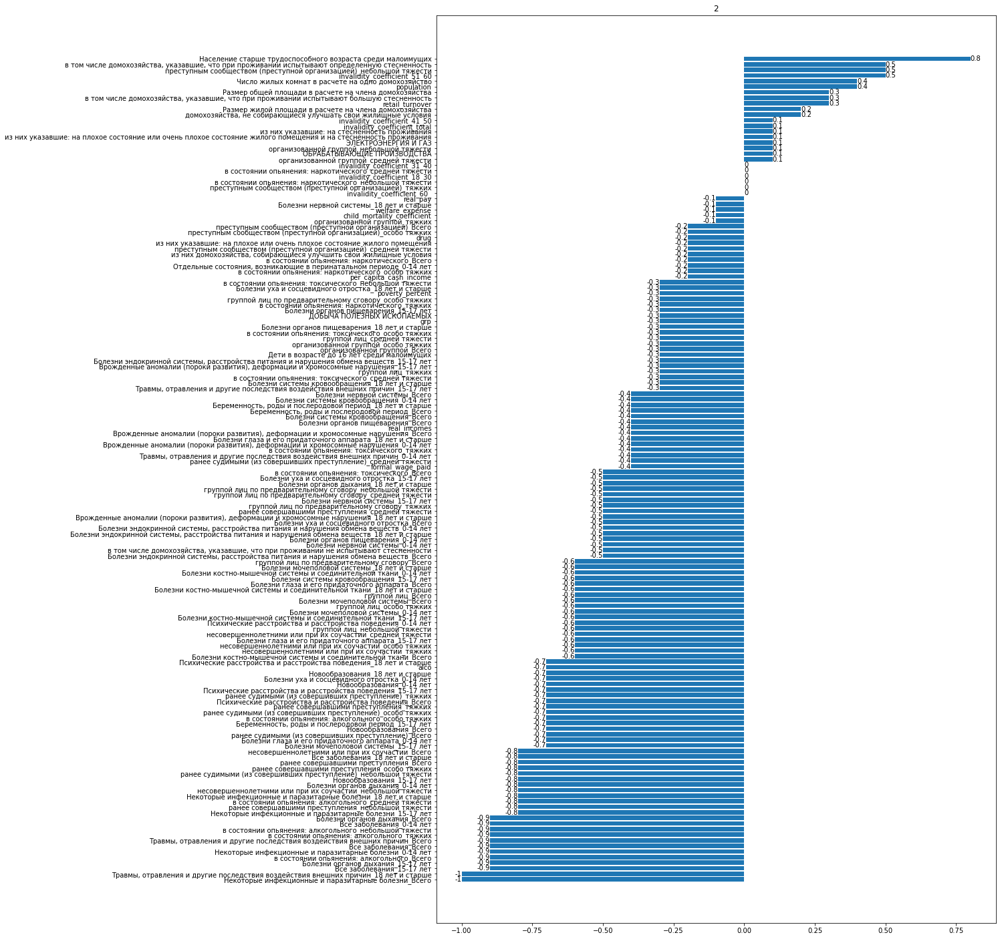

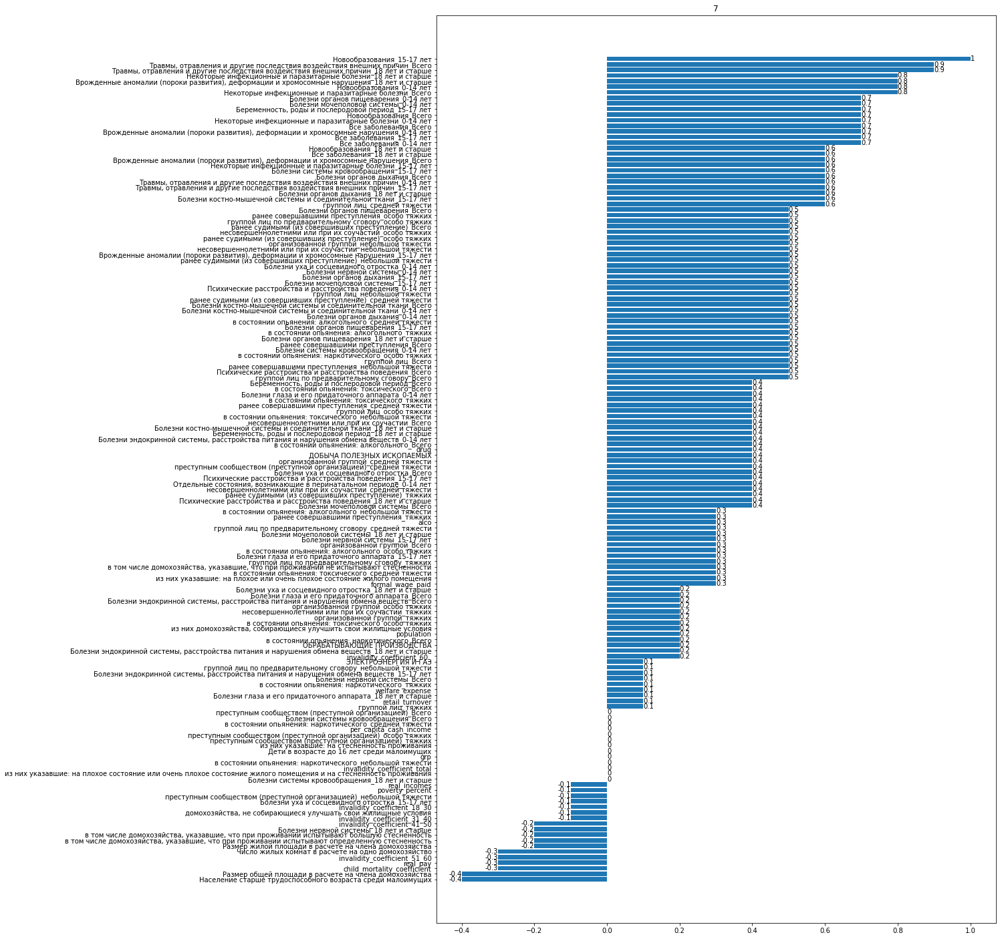

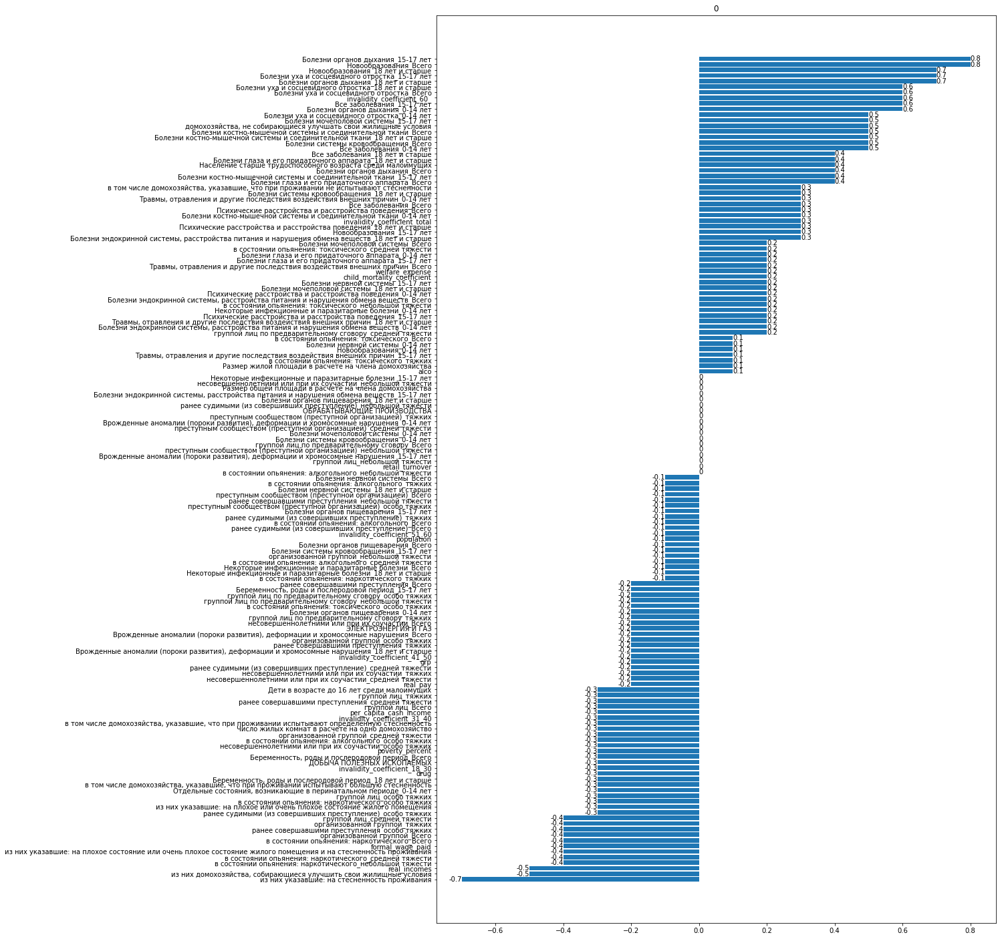

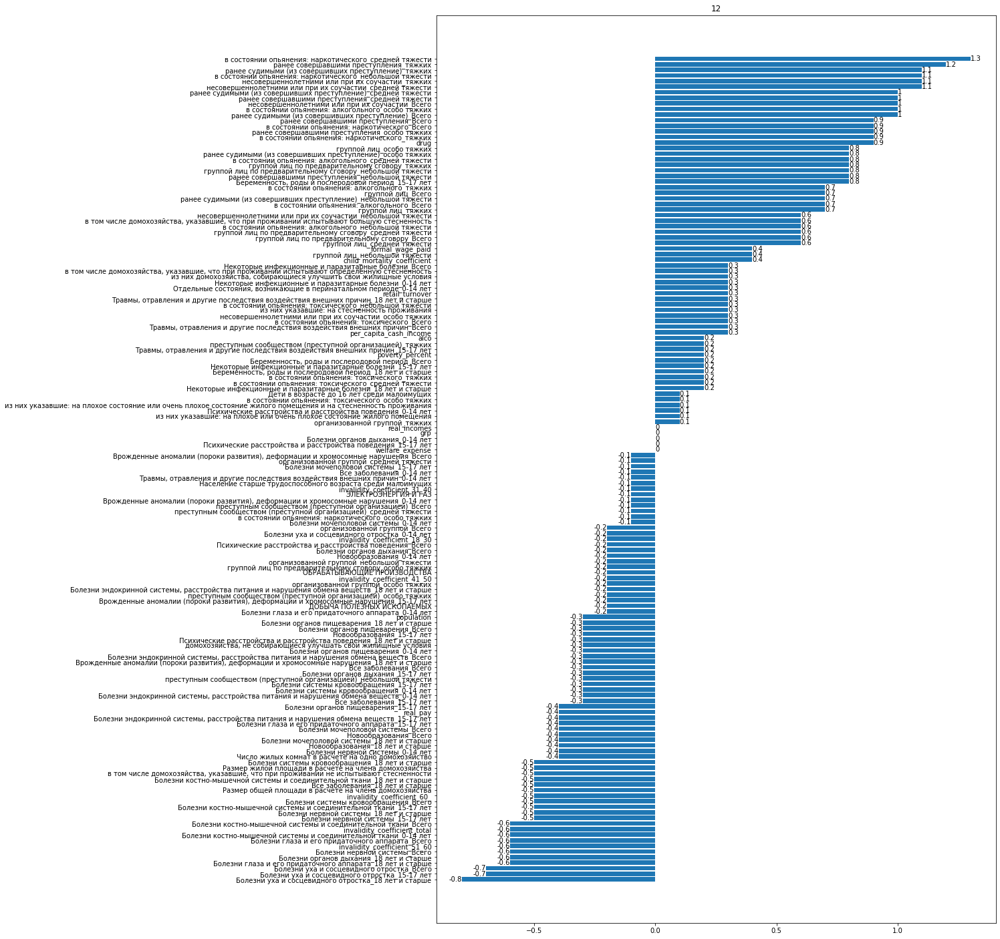

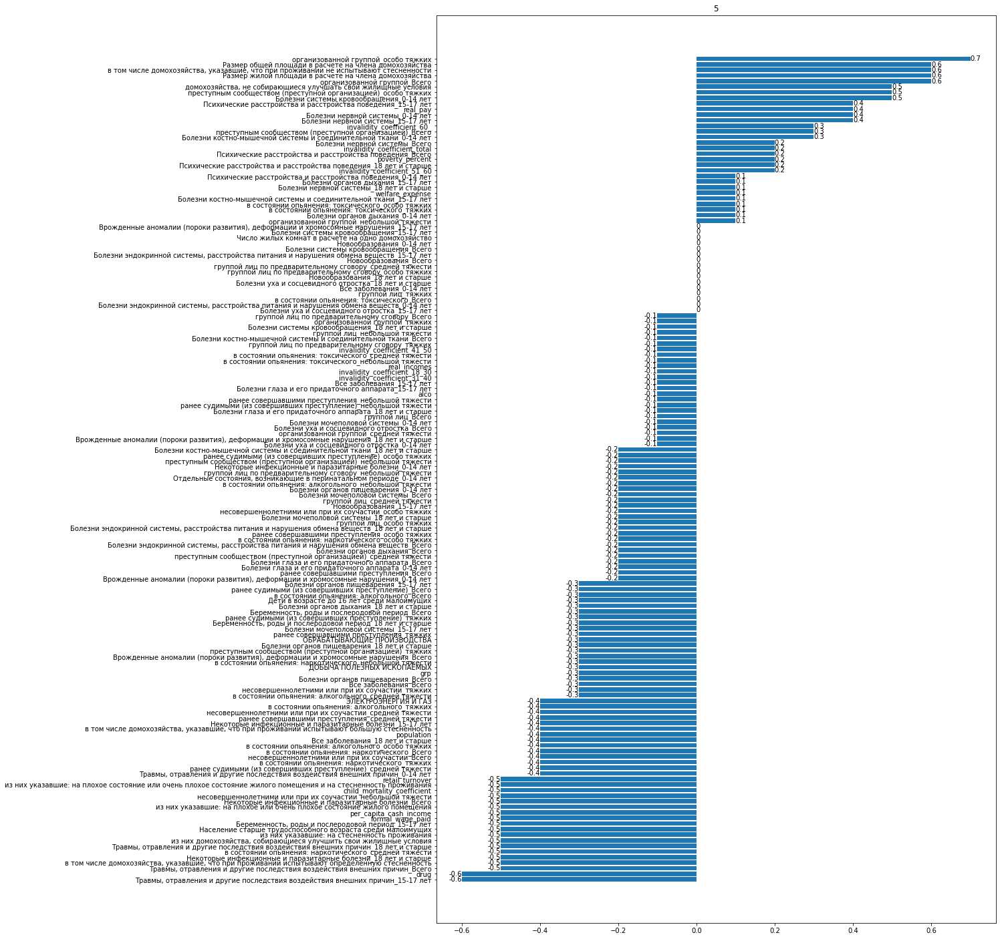

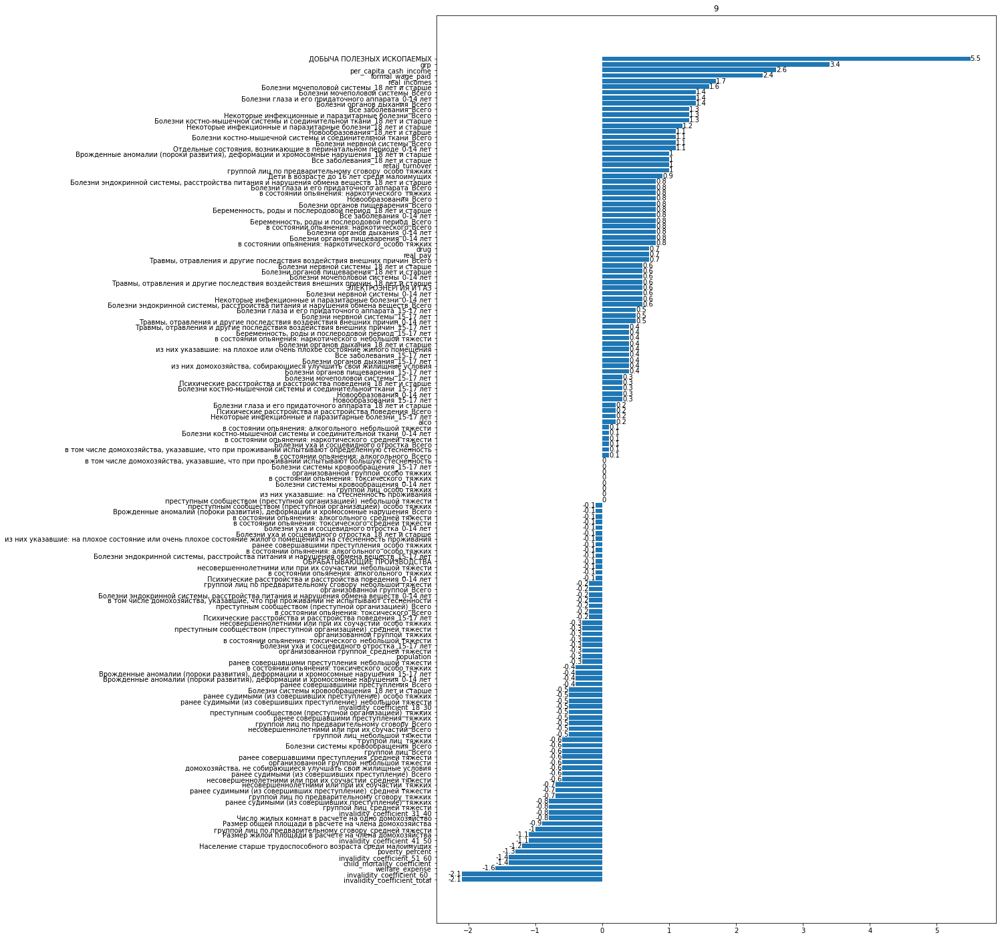

In [13]:
for cluster in [2,7,0,12,5,9]:
    series = cluster_mean_df[cluster].sort_values().round(1)
    fig, ax = plt.subplots(figsize=(15,25))
    bar = ax.barh(y=series.index, width=series)
    ax.bar_label(bar)
    ax.set_title(cluster)
    plt.show()

**Описание кластеров:**
- кластер 2: много малоимущих пожилых, преступные организации (небольшая тяжесть), населения немного больше среднего, болезней меньше.
- кластер 7: больше болезней и преступности.
- кластер 0: больше болезней.
- кластер 12: больше преступности, меньше болезней, больше наркомании, больше смертности младенцев.
- кластер 5: меньше жалоб на жильё, меньше наркомании, меньше травм, меньше детской смертности, меньше среднедушевных доходов.
- кластер 9: много добычи ископаемых, высокий ВРП, много дохода у населения, больше болезней, больше наркомании, мало бедности, мало смертности младенцев, мало инвалидности.

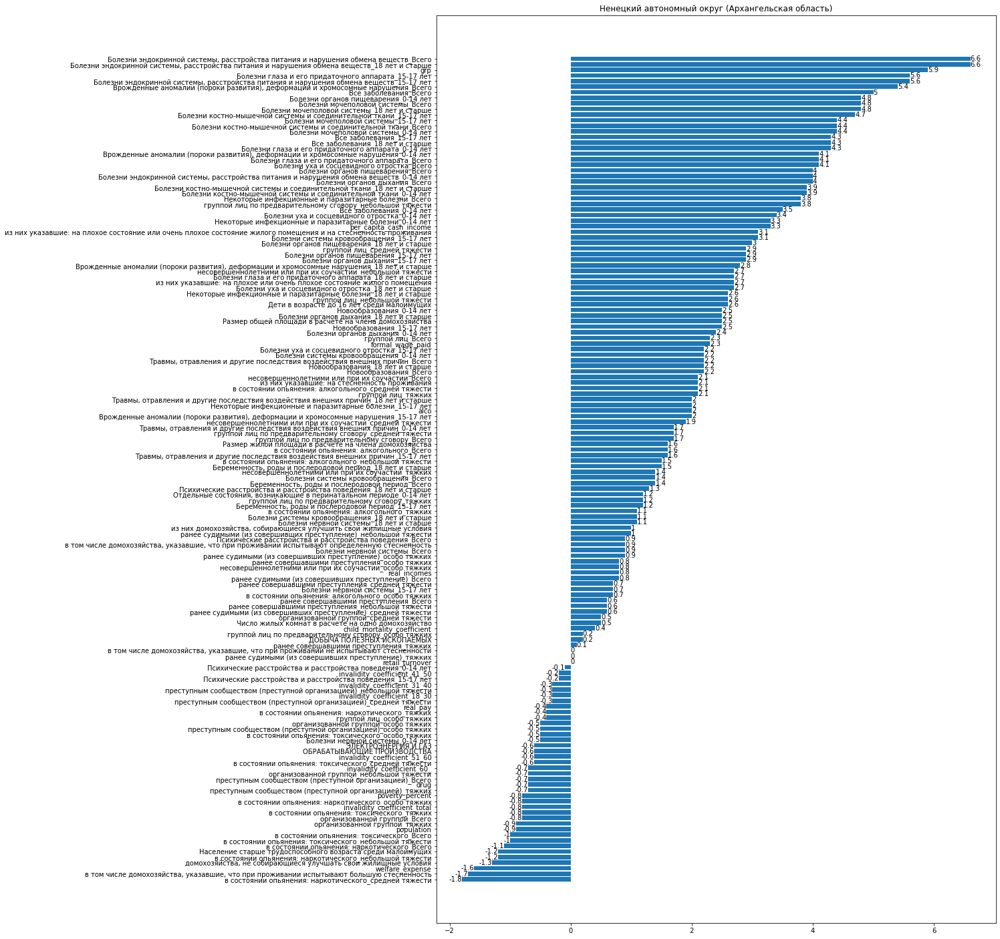

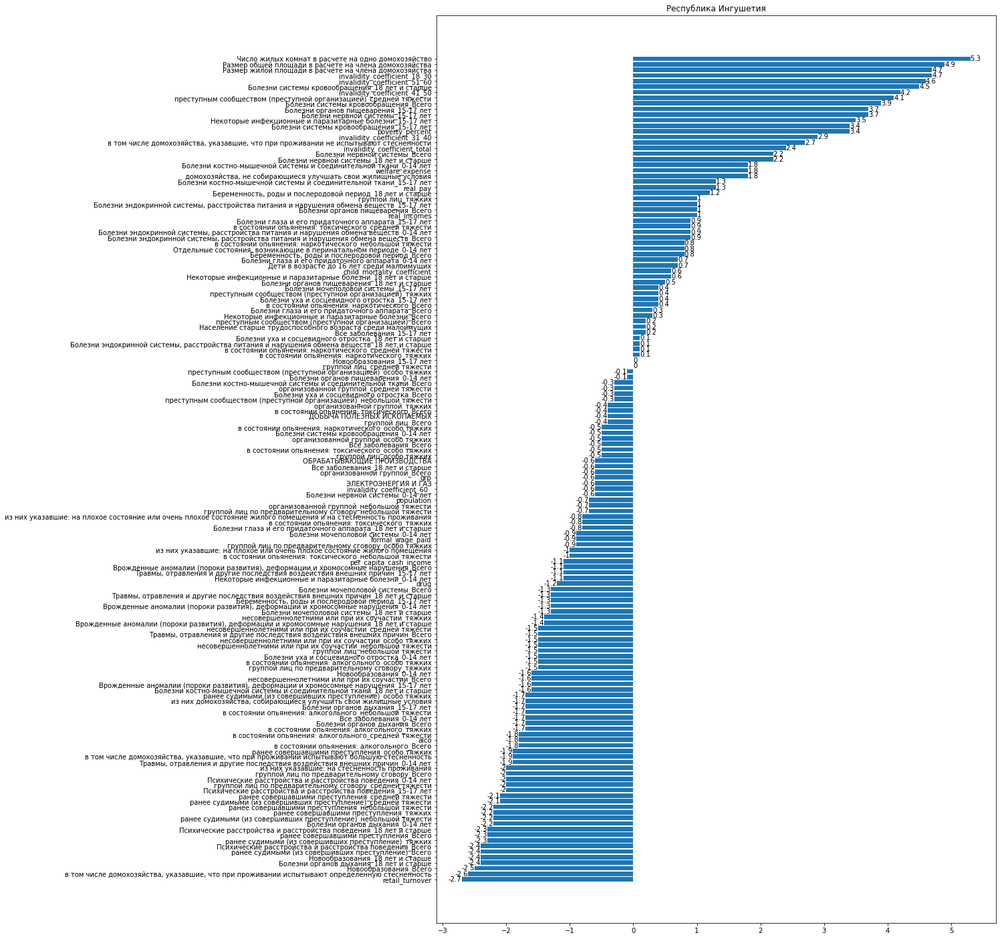

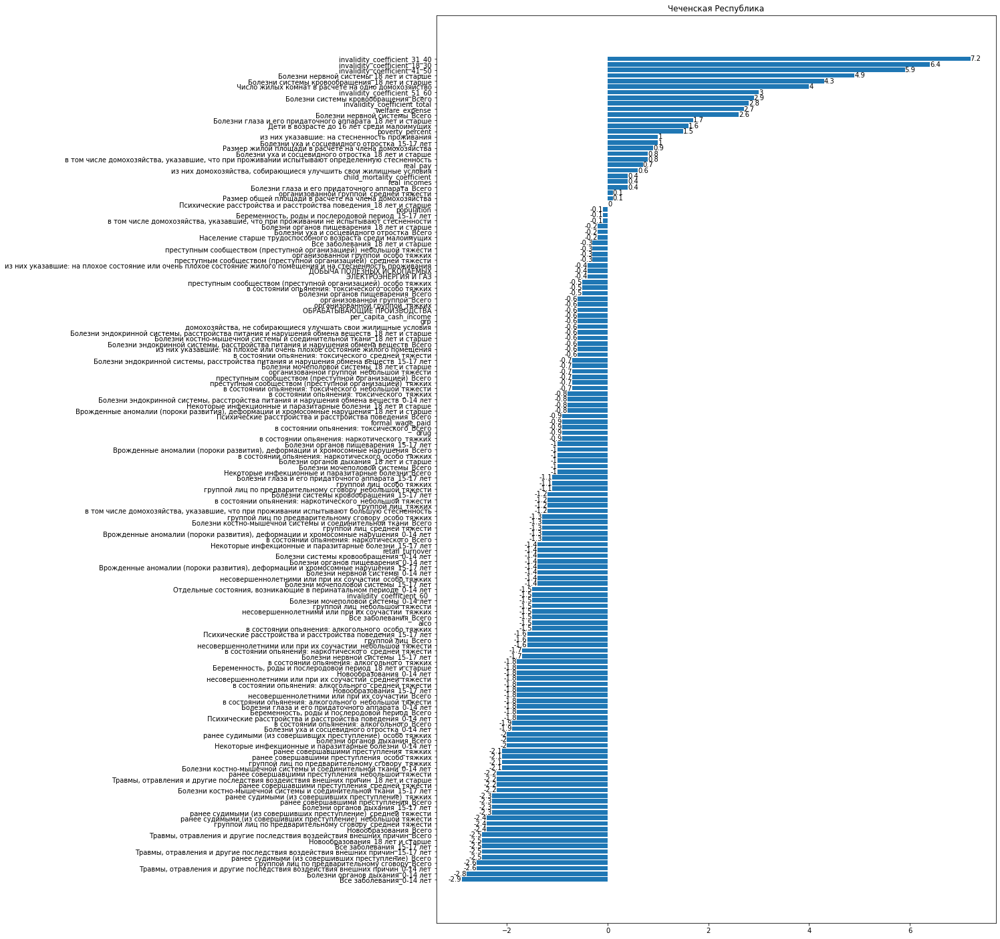

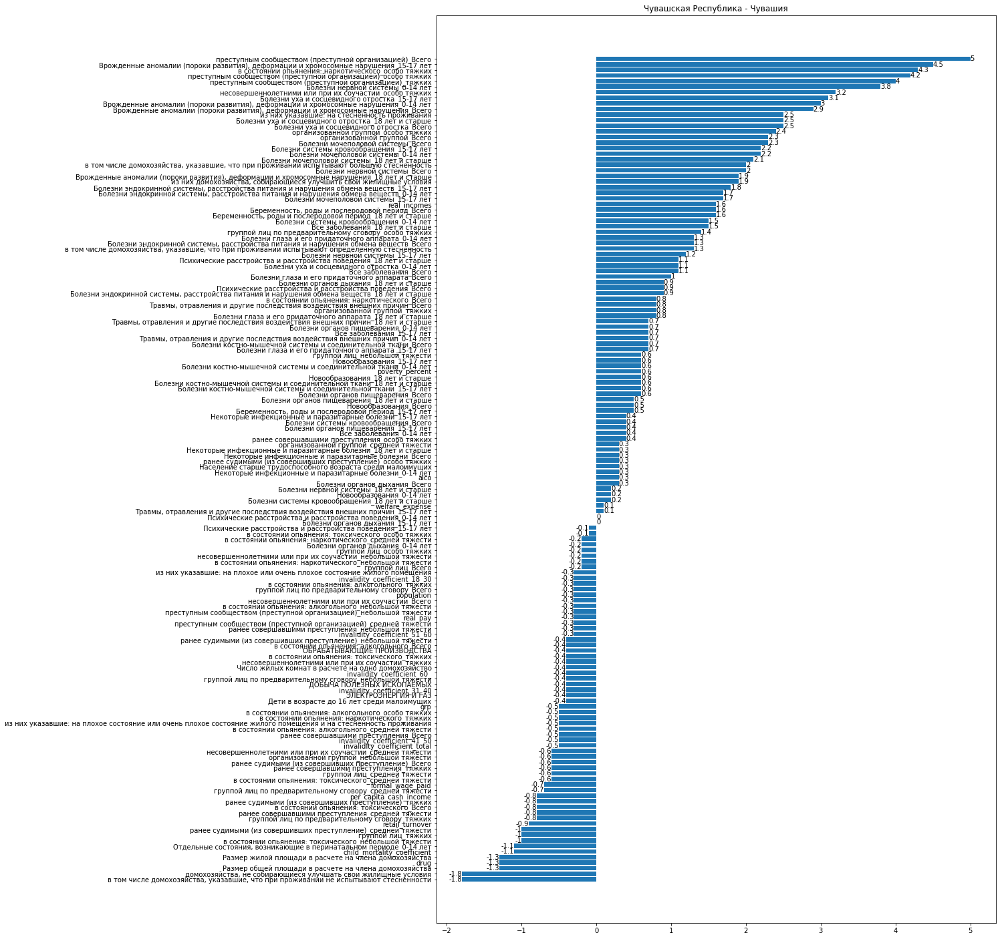

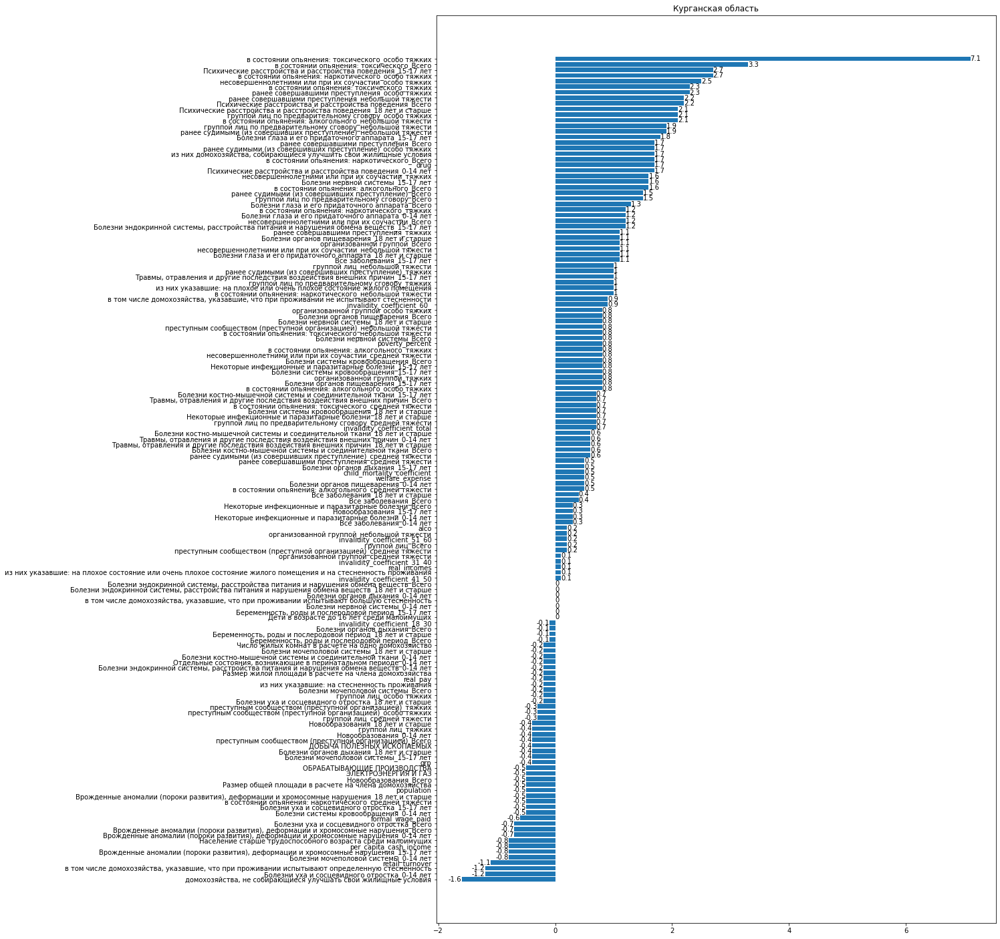

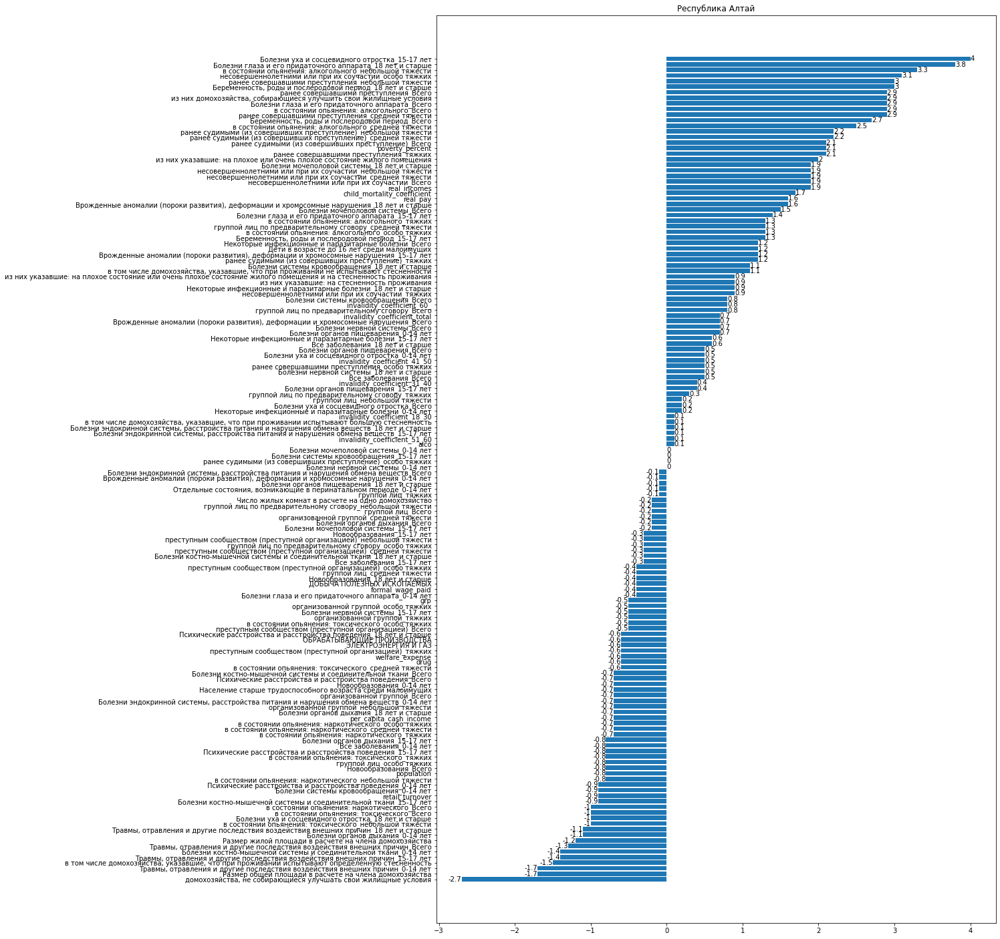

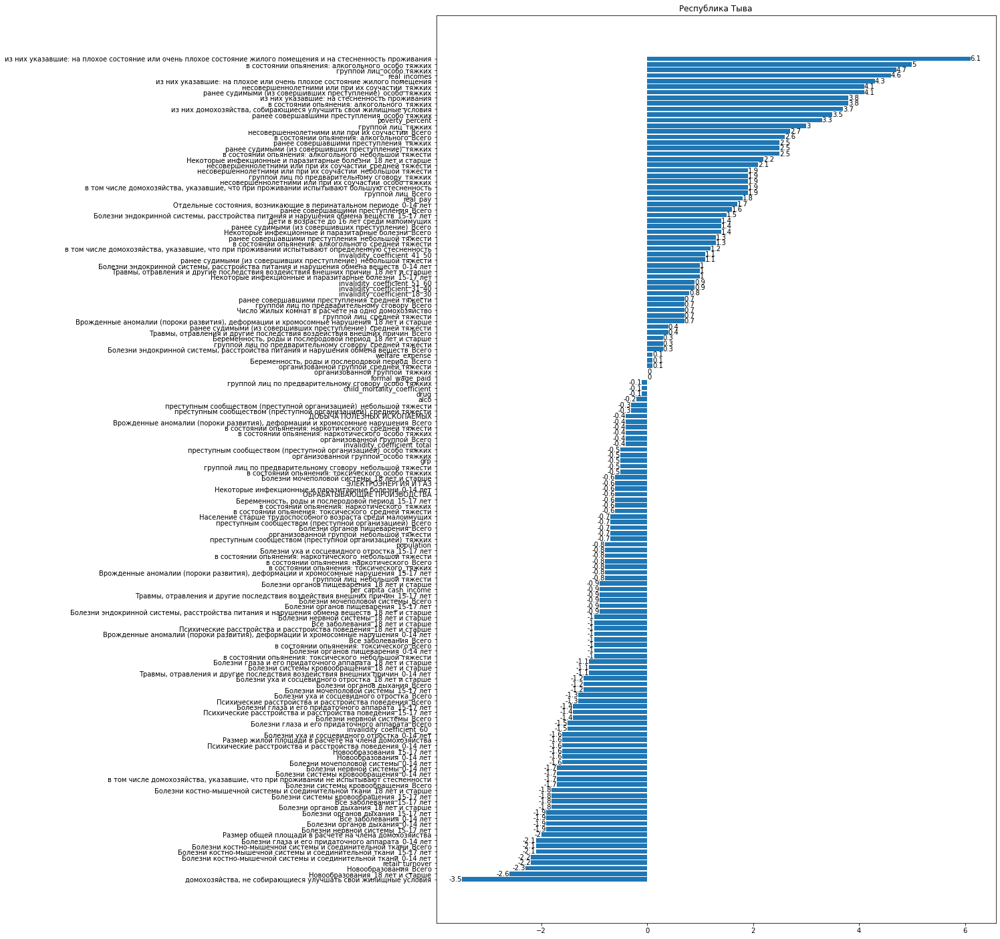

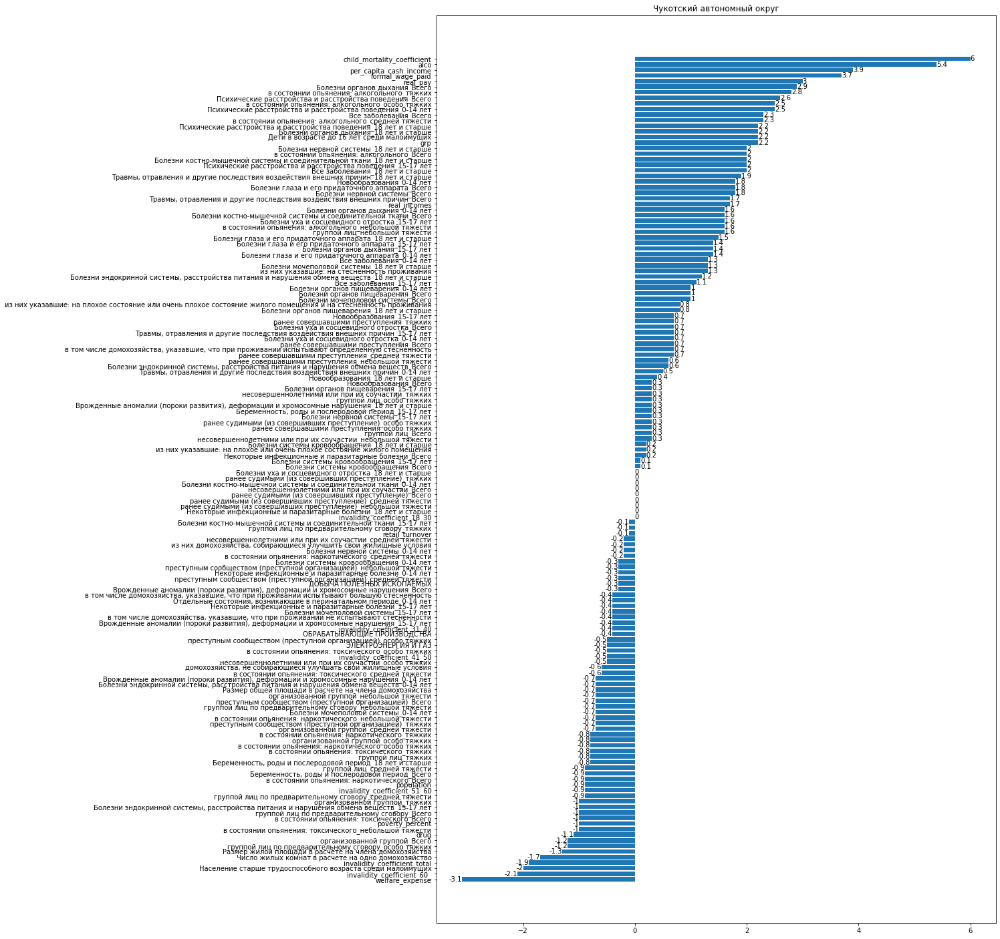

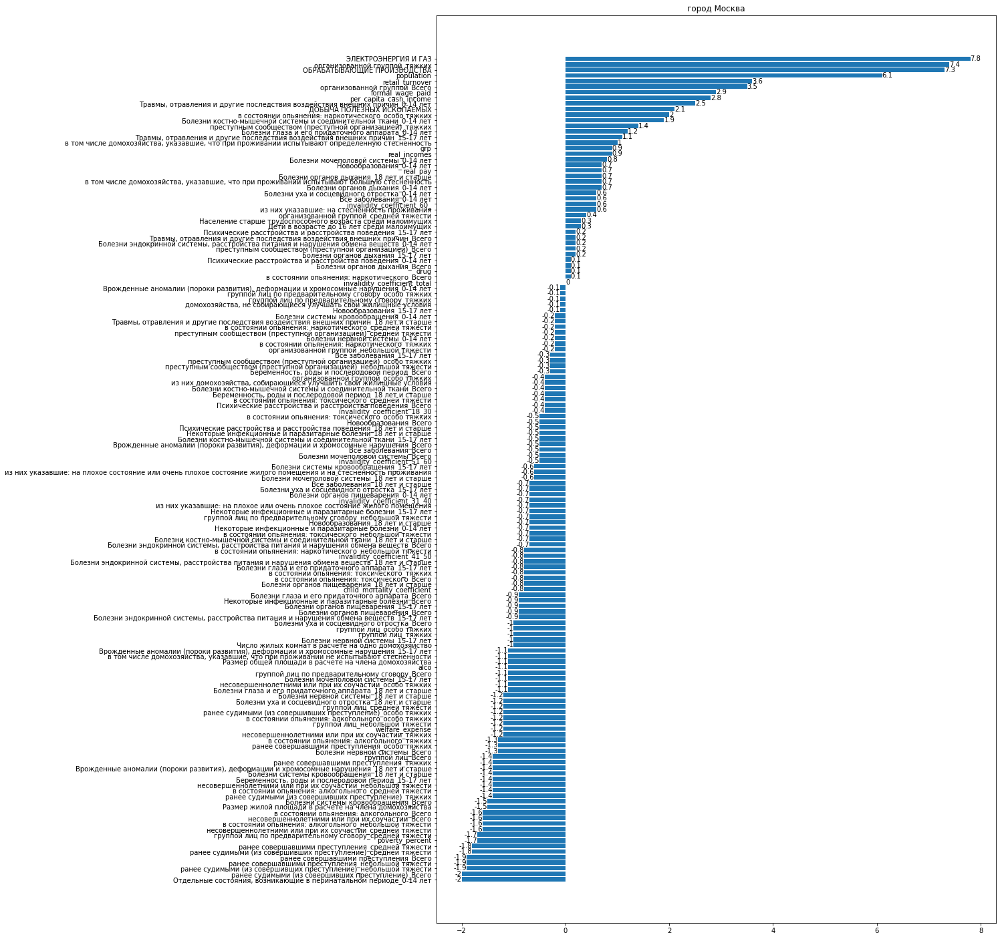

In [18]:
for cluster in [1,3,4,6,8,10,11,13,14]:
    series = cluster_mean_df[cluster].sort_values().round(1)
    fig, ax = plt.subplots(figsize=(15,25))
    bar = ax.barh(y=series.index, width=series)
    ax.bar_label(bar)
    ax.set_title(df[df['cluster']==cluster].index[0])
    plt.show()

**Описание выбросов:**
- Ненецкий автономыный округ (Архангельская область):очень высокая заболеваемость, больше алкоголизма, высокий ВРП, высокие зарплаты, больше преступности группой лиц, меньше пожилых среди малоимущих. 
- Республика Ингушетия: высокая инвалидность, высокая бедность, больше болезней и смертности младенцев, населения меньше, меньше преступности, мало алкоголизма и наркомании.
- Чеченская республика: высокая инвалидность, высокая бедность, мало преступности и болезней.
- Чувашская республика - Чувашия: высокая заболеваемость, преступные организации, больше бедности, меньше ВРП, меньше наркомании.
- Курганская область: высокая преступность, высокая наркомания, высокая заболеваемость, высокая инвалидность, больше бедность, меньше населения.
- Республика Алтай: высокая заболеваемость и смертность младенцев, высокая бедность, высокая преступность.
- Республика Тыва: высокая бедность, высокая преступность, болезней некоторых больше, некоторых меньше, много жалоб на жильё.
- Чукотский автономный округ: высокая смертность младенцев, высокий алкоголизм, высокий ВРП и среднедушевный доход, низкая бедность, высокая заболеваемость.
- город Москва: много населения,высокий среднедушевный доход, мало бедности, много производства, болезней и преступности меньше. 

In [126]:
rename_clusters = dict(cluster_mean_df.loc['poverty_percent'].sort_values().round(1))
df['Нужна помощь'] = df['cluster'].replace(rename_clusters)

**Таблица для определения особо нуждающихся регионов**

In [129]:
need_held = pd.DataFrame(index=df['Нужна помощь'].unique())
for cluster in df['Нужна помощь'].unique():
    regions = df[df['Нужна помощь']==cluster].index
    need_held.loc[cluster,'regions'] = regions
need_held = need_held.sort_index(ascending=False)

In [135]:
need_held

,regions
3.4,Республика Ингушетия
3.3,Республика Тыва
2.1,Республика Алтай
1.5,Чеченская Республика
0.8,Курганская область
0.6,Чувашская Республика - Чувашия
0.2,"[Брянская область, Калужская область, Костромс..."
-0.1,"[Республика Карелия, Республика Коми, Архангел..."
-0.3,"[Белгородская область, Владимирская область, В..."
-0.8,Ненецкий автономный округ (Архангельская область)


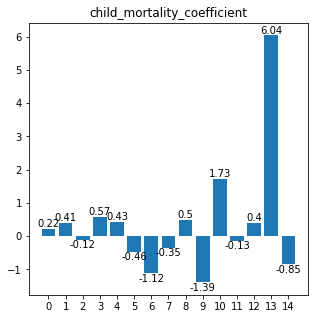

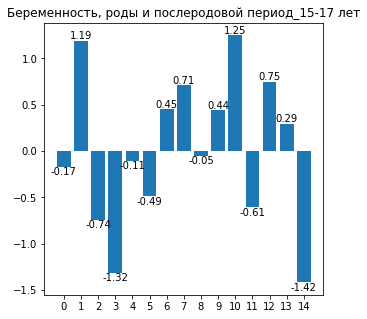

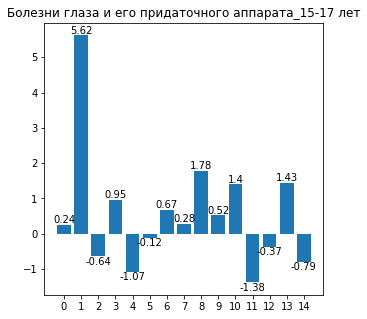

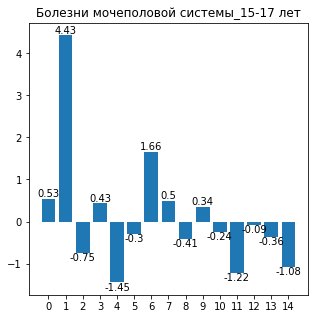

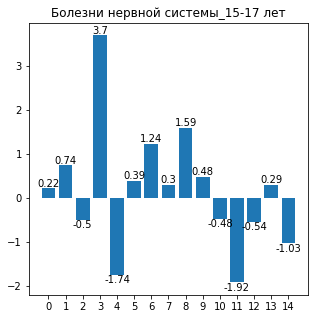

...

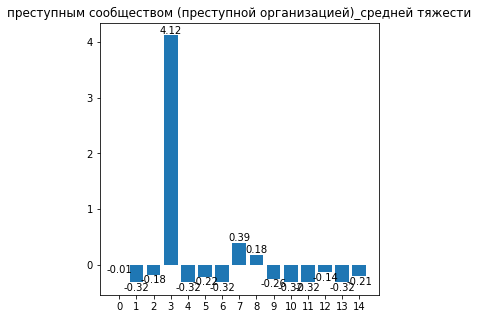

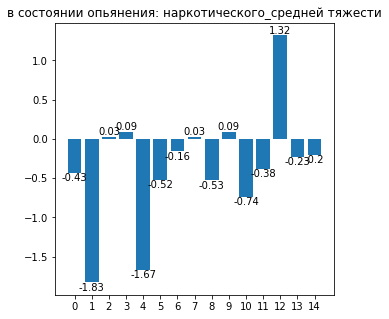

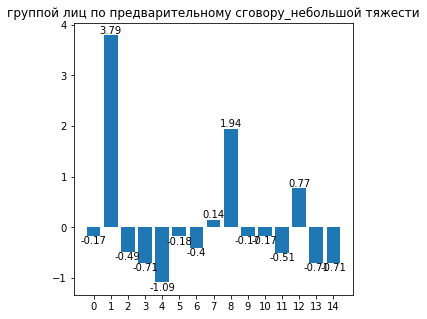

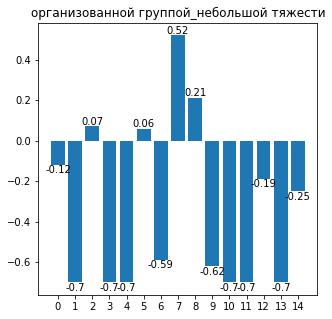

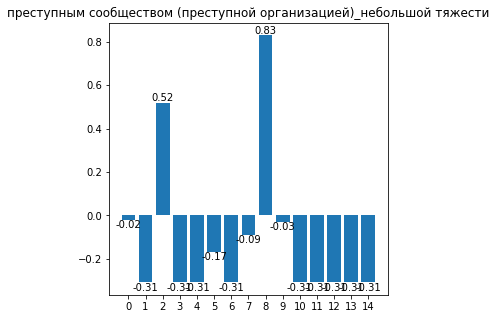

In [110]:
for col in cluster_mean_df.index:
    series = cluster_mean_df.loc[col].round(2)
    fig, ax = plt.subplots(figsize=(5,5))
    bar = ax.bar(x=series.index, height=series)
    ax.bar_label(bar)
    ax.set_title(col)
    ax.set_xticks(series.index)
    plt.show()

In [96]:
cluster = 2
df[df['cluster']==cluster].mean()

child_mortality_coefficient                                          -0.120367
Беременность, роды и послеродовой период_15-17 лет                   -0.740058
Болезни глаза и его придаточного аппарата_15-17 лет                  -0.640193
Болезни мочеполовой системы_15-17 лет                                -0.748195
Болезни нервной системы_15-17 лет                                    -0.497750
                                                                        ...   
в состоянии опьянения: наркотического_средней тяжести                 0.032527
группой лиц по предварительному сговору_небольшой тяжести            -0.486818
организованной группой_небольшой тяжести                              0.074073
преступным сообществом (преступной организацией)_небольшой тяжести    0.522654
cluster                                                               2.000000
Length: 67, dtype: float64

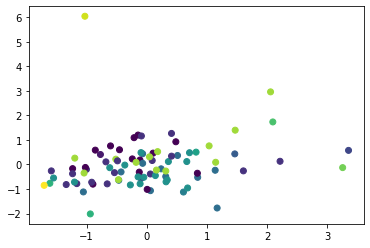

In [93]:
plt.scatter(x=df['poverty_percent'], y=df['child_mortality_coefficient'], c=df['cluster']);

# Кластеризация выборочных признаков

In [37]:
cols_selected = ['population',
                 'poverty_percent',
                 'per_capita_cash_income']
df_selected = df_scaled_without_multicoll[cols_selected]

## KMeans

In [21]:
def get_n(df,max_n):
    scores = []
    for n in range(2,max_n):
        model = KMeans(n_clusters=n, n_init=20, random_state=42)
        model.fit(df)
        scores.append(silhouette_score(df,model.labels_))
    fig, ax = plt.subplots()
    ax.plot(range(2,max_n),scores)
    return ax

In [22]:
def inertia_n(df,max_n):
    scores = []
    for n in range(2,max_n):
        model = KMeans(n_clusters=n, n_init=20, random_state=42)
        model.fit(df)
        scores.append(model.inertia_)
    plt.plot(range(2,max_n),scores);

### Подбираем n_clusters

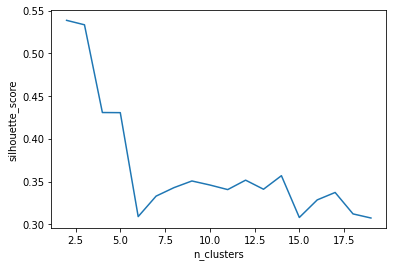

In [38]:
ax = get_n(df_selected,20)
ax.set_xlabel('n_clusters')
ax.set_ylabel('silhouette_score')
plt.show()

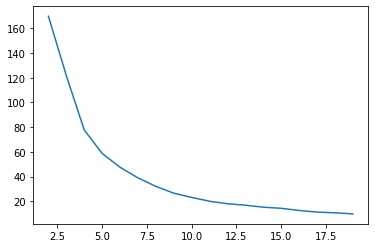

In [39]:
inertia_n(df_selected,20)

### Смотрим результаты модели

In [119]:
#transformed_df = t_SNE(df=df_selected, n_components=7)
model = KMeans(n_clusters=9, n_init=20, random_state=42)
model.fit(df_selected)
print(silhouette_score(df_selected,model.labels_))
df = df_scaled.copy()
df['cluster'] = model.labels_
df['cluster'].value_counts()

0.3506937904897495


cluster
1    23
8    16
6    13
7    11
5     6
0     5
2     5
4     5
3     1
Name: count, dtype: int64

In [120]:
cluster_mean_df = pd.DataFrame(index=df.columns)
for cluster in range(9):
    cluster_mean_df[cluster] = df[df['cluster']==cluster].mean()
cluster_mean_df = cluster_mean_df.drop('cluster')

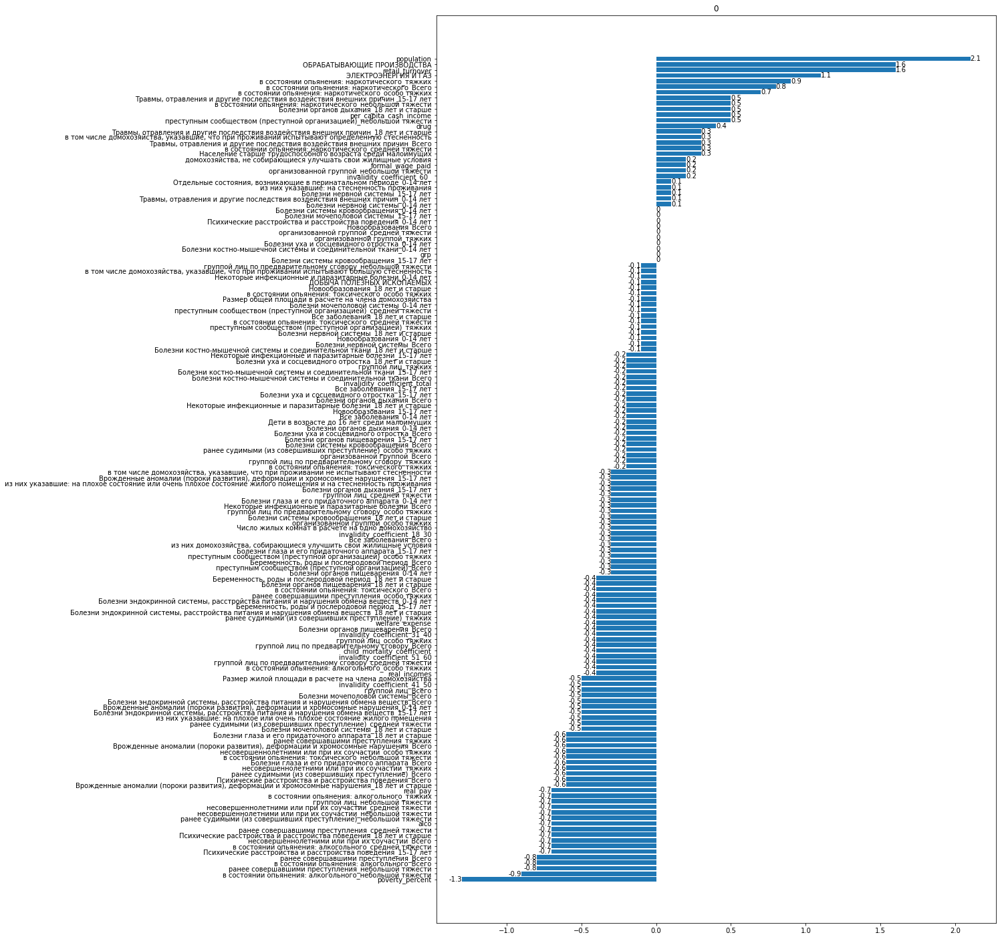

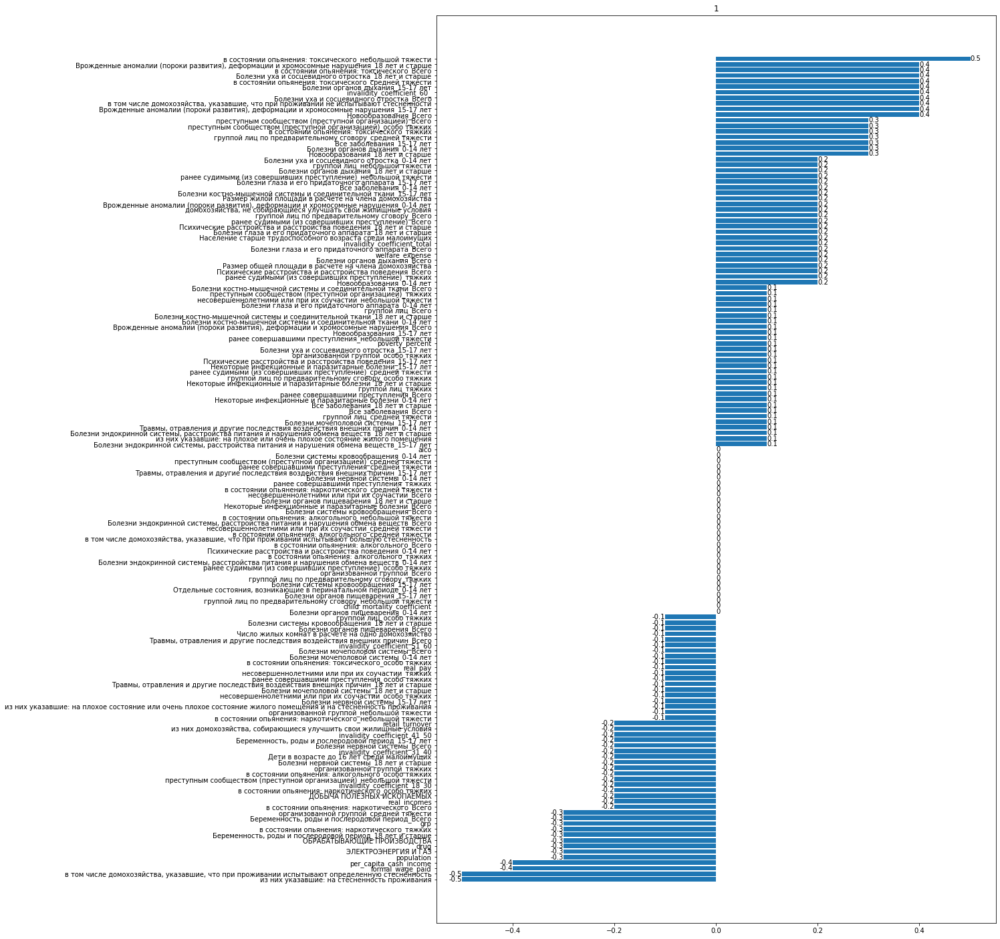

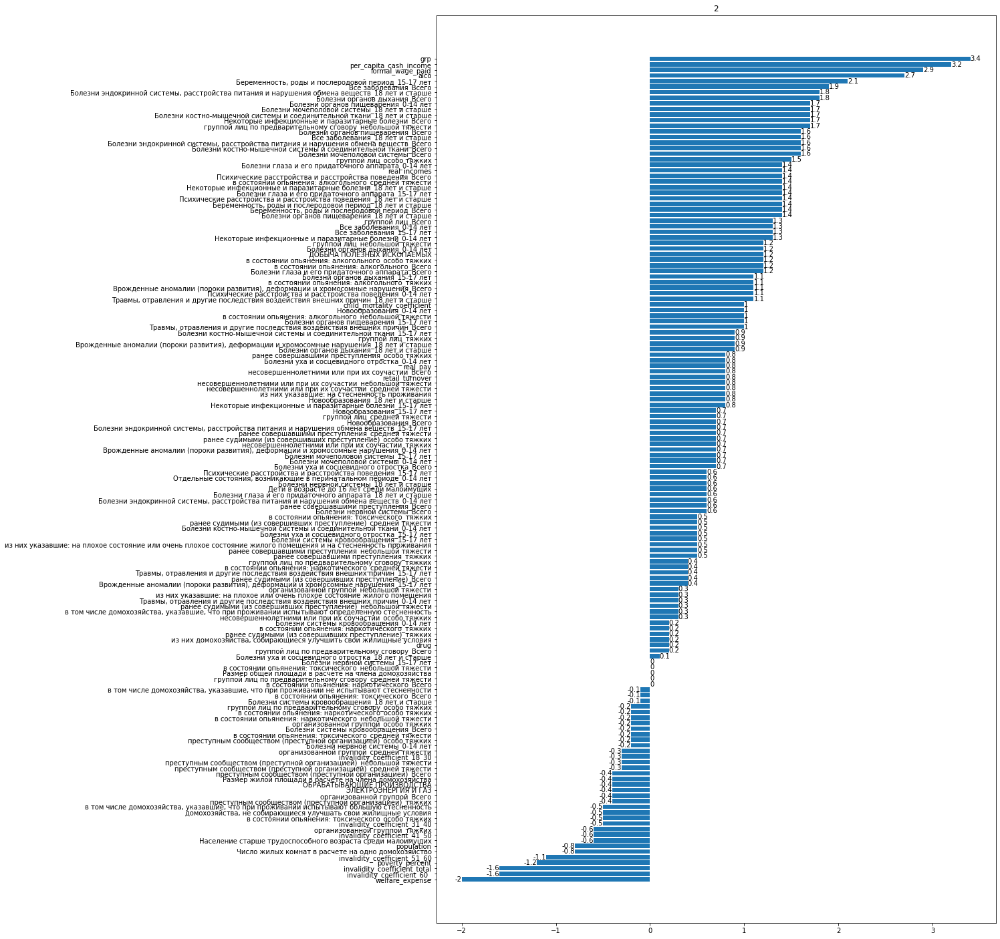

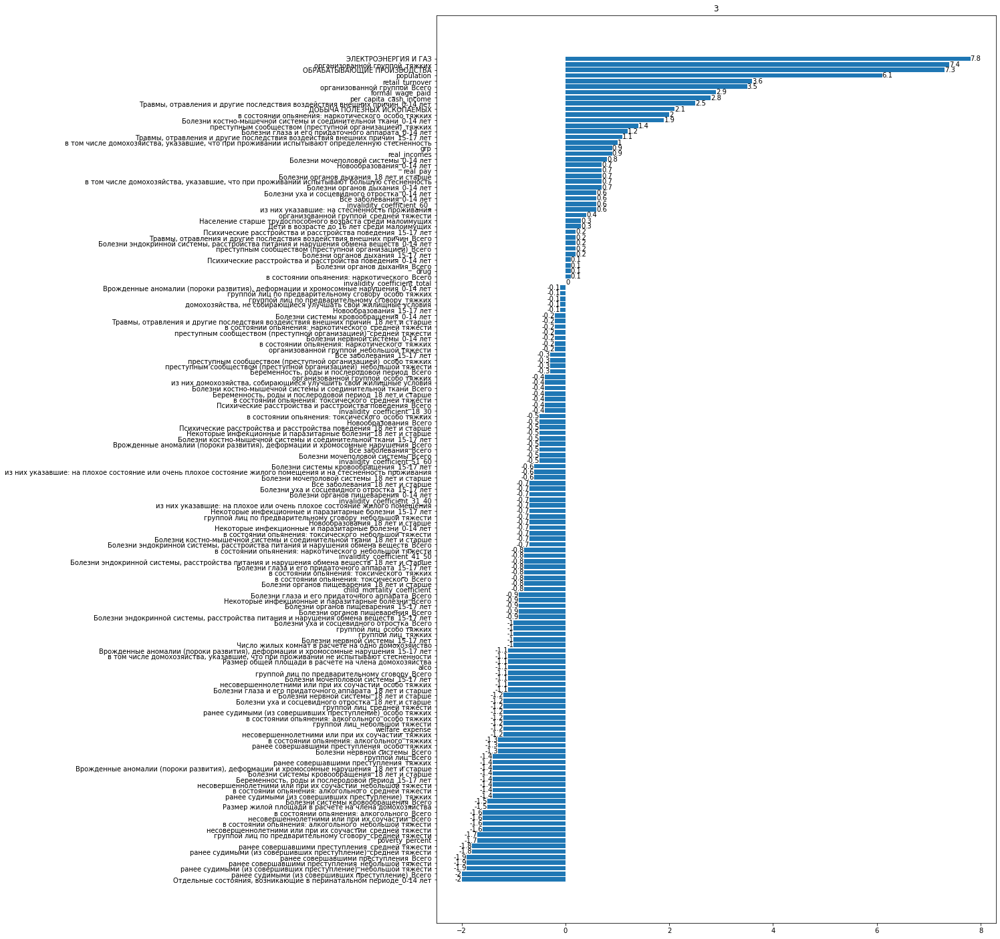

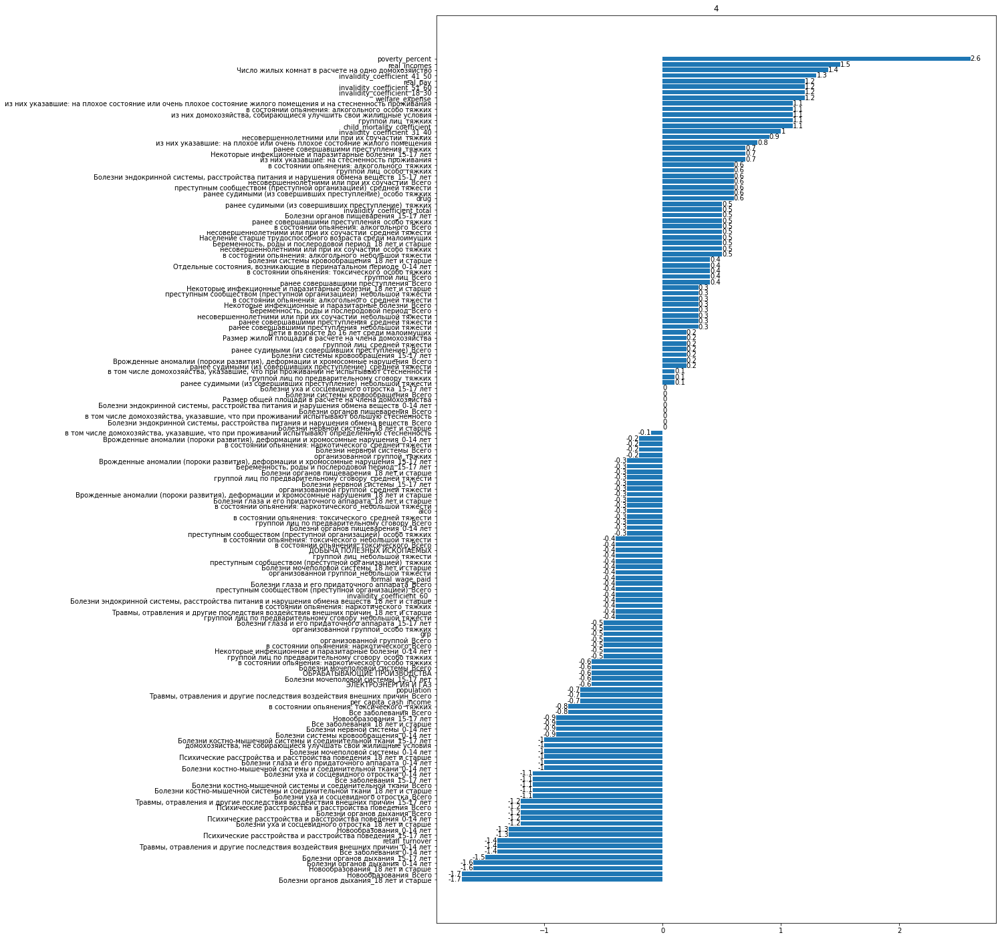

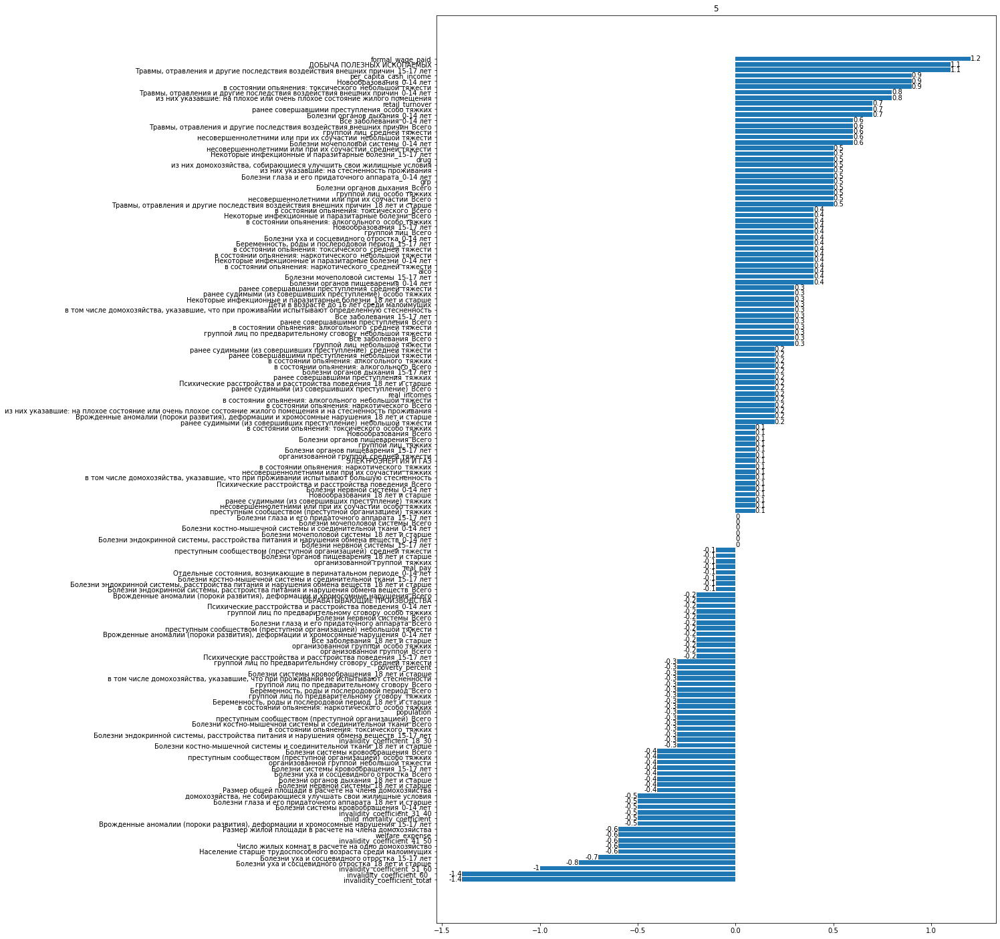

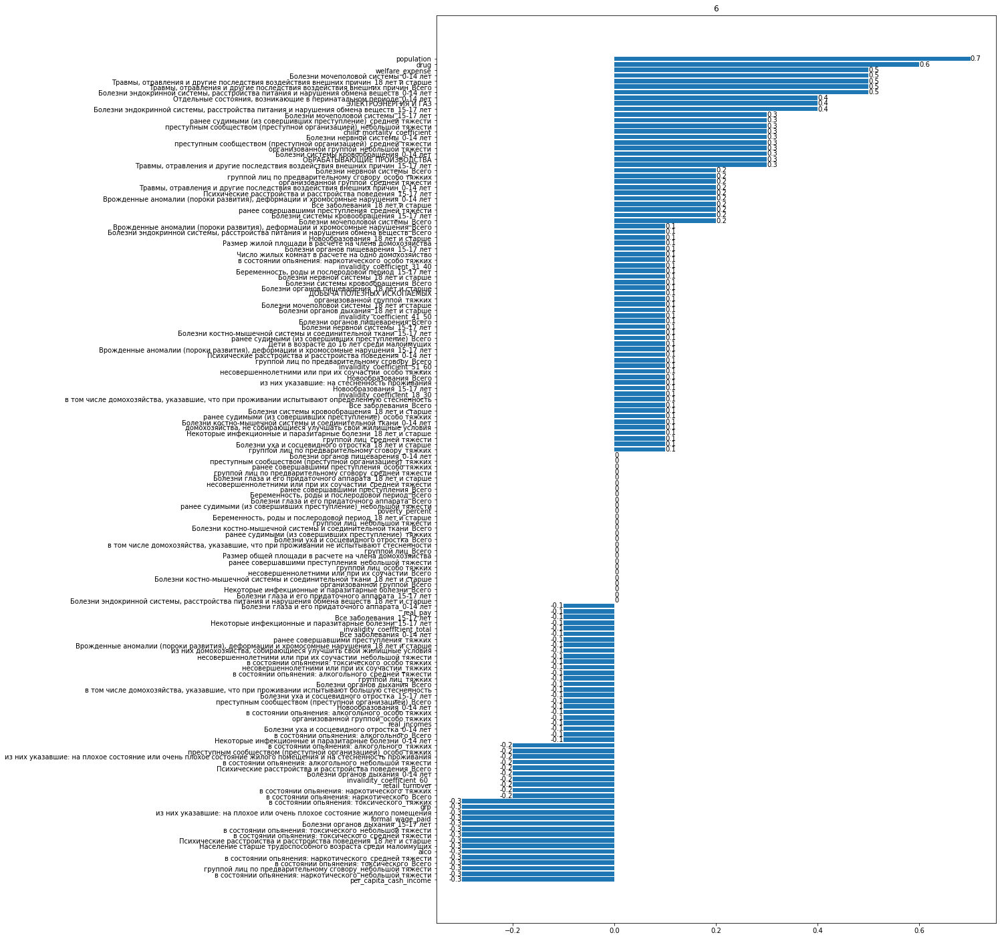

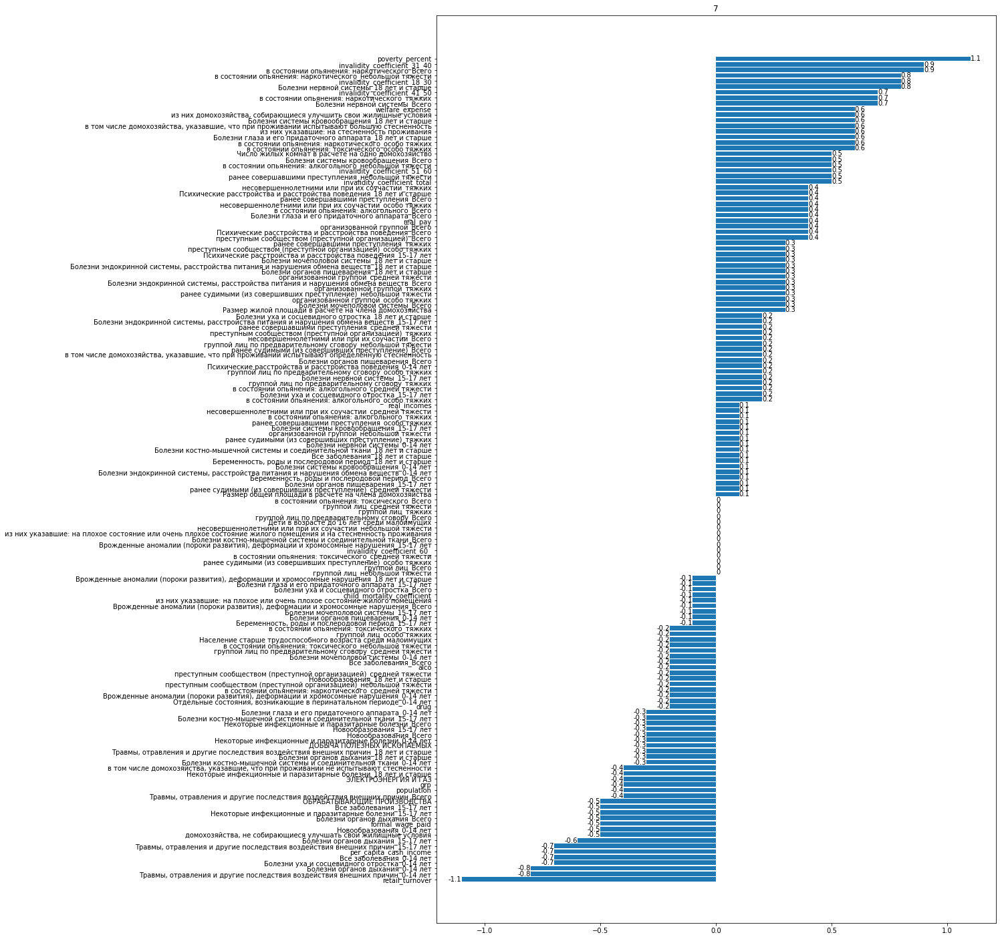

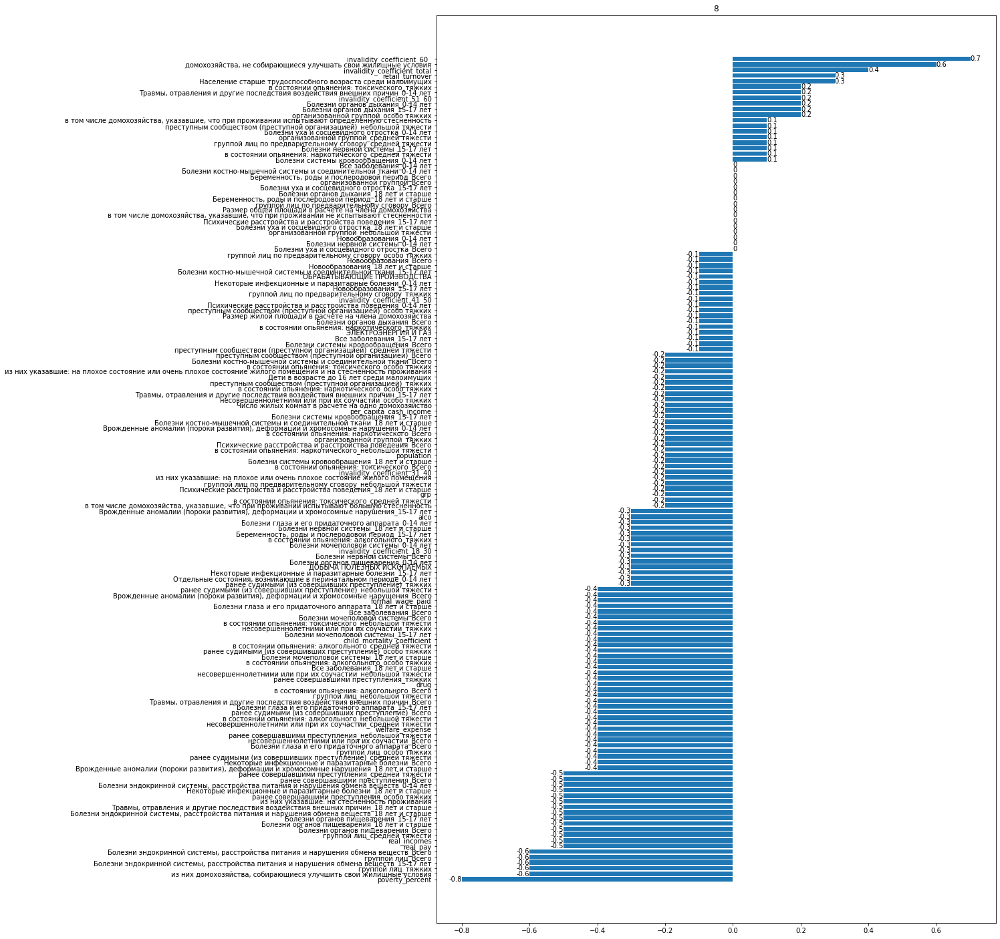

In [45]:
for cluster in range(9):
    series = cluster_mean_df[cluster].sort_values().round(1)
    fig, ax = plt.subplots(figsize=(15,25))
    bar = ax.barh(y=series.index, width=series)
    ax.bar_label(bar)
    ax.set_title(cluster)
    plt.show()

**Описание кластеров:**
- 0: много населения, много производства, мало бедности.
- 1: все показатели более-менее средние.
- 2: мало населения, высокий ВРП, мало бедности, высокий алкоголизм, высокая заболеваемость, высокая детская смертность, больше преступлений группой лиц.
- 3: много населения, много производства, много добычи полезных ископаемых, мало бедности, много преступлений организованной группой лиц, болезней некоторых больше, некоторых меньше. 
- 4: высокая бедность, высокая инвалидность, высокая детская смертность, мало населения, мало зарегистрированных болезней.
- 5: много добычи полезных ископаемых, бедности немного меньше среднего, мало инвалидности, заболеваемость и преступность средняя.
- 6: показатели более-менее средние, немного больше населения и наркомании.
- 7: показатели более-менее средние, только высокая бедность, малый товарооборот.
- 8: показатели более-менее средние, но бедности меньше.

Регионы от более обеспеченных, к менее обечпеченным: 4, 7, 1, 6, 5, 8, 2, 0, 3

In [121]:
rename_clusters = dict(cluster_mean_df.loc['poverty_percent'].sort_values().round(1))
df['Нужна помощь'] = df['cluster'].replace(rename_clusters)

**Таблица для определения особо нуждающихся регионов**

In [122]:
need_held = pd.DataFrame(index=df['Нужна помощь'].unique())
for e in df['Нужна помощь'].unique():
    regions = df[df['Нужна помощь']==e].index
    need_held.loc[e,'regions'] = regions
need_held = need_held.sort_index(ascending=False)

In [123]:
need_held

,regions
2.6,"[Республика Ингушетия, Кабардино-Балкарская Ре..."
1.1,"[Республика Калмыкия, Карачаево-Черкесская Рес..."
0.1,"[Брянская область, Владимирская область, Ивано..."
0.0,"[Волгоградская область, Ростовская область, Ре..."
-0.3,"[Мурманская область, Ханты-Мансийский автономн..."
-0.8,"[Белгородская область, Воронежская область, Ка..."
-1.2,[Ненецкий автономный округ (Архангельская обла...
-1.3,"[Московская область, Краснодарский край, Респу..."
-1.7,город Москва
